In this notebook we intend to build directly upon the Vanilla GAN implementation available in our GitHub repository. While the Vanilla GAN serves as a strong baseline for generative modeling, it is known to suffer from several training issues — including mode collapse, training instability, and gradient saturation — especially when learning complex, multi-modal distributions.

To address these shortcomings, we now turn to a more robust formulation: the Wasserstein GAN (WGAN) with Gradient Penalty, proposed by  [Gulrajani et al. in 2017] (https://arxiv.org/pdf/1704.00028). 
WGAN replaces the traditional GAN's loss function based on the Jensen-Shannon divergence with a metric rooted in optimal transport theory — the Earth Mover’s Distance (EMD), also known as the Wasserstein-1 distance. The Wasserstein-1 distance, between the real data distribution $\mathbb{P}_r$​ and the generated data distribution $\mathbb{P}_g$ is denoted as $ W(\mathbb{P}_r, \mathbb{P}_g) $, and defined as:
    $$
            W(\mathbb{P}_r, \mathbb{P}_g) = \inf_{\gamma \in \Pi(\mathbb{P}_r, \mathbb{P}_g)} \mathbb{E}_{(x, y) \sim \gamma}[\|x - y\|]
        $$

Unlike Vanilla GANs, WGAN:
- Uses a critic instead of a discriminator to evaluate how "real" a sample is.
- Avoids the use of sigmoid activation in the output layer of the critic.
- Employs a Wasserstein loss, which correlates better with the quality of generated samples.
- Enforces the Lipschitz continuity constraint.


The vanilla WGAN uses weight clipping to enforce the 1-Lipschitz constraints, i.e., constraining the critic's parameters to lie within a certain range. Although clipping helps enforce the constraint it brings some issue such as poor gradient flow, oversimplified networks and in some cases, failure to converge at all.

To address this issue we replace the weight clipping with the gradient penalty method. Which we delve into next.
The WGAN-GP enforces the Lipschitz constraint by penalizing the norm of the critic's gradient with respect to its input. Instead of limiting the weights forcibly, WGAN-GP encourages the critic's gradient to have a norm close to 1 during training. It does so by introducing a gradient penalty term to critic's loss. Mathematically, we describe the Gradient Penalty as: 

$$
\text{GP} = \lambda \cdot \mathbb{E}_{\hat{x} \sim \mathbb{P}_{\hat{x}}} \left( \| \nabla_{\hat{x}} D(\hat{x}) \|_2 - 1 \right)^2
$$

where:  
- $ \hat{x} $ are points sampled uniformly along straight lines between real data samples $ x \sim \mathbb{P}_r $ and generated samples $ \tilde{x} \sim \mathbb{P}_g $,  
- $ D(\hat{x}) $ is the critic output for input $ \hat{x} $,  
- $ \lambda $ is a hyperparameter controlling the strength of the penalty.

This penalty term helps stabilize training by softly enforcing the Lipschitz continuity constraint on the critic function.

---

Now coming over to the architecture of our networks: 
We are using a Generator that takes a random noise as input and transforms it into a data sample that aims to resemble the real data distribution. It's goal is to "fool" the critic by generating realistic samples.
Then we define the Critic, which evaluates how "real" each sample is. We will also define a Discriminator for the vanilla GAN as we want to compare both the models.



In [32]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.autograd import grad

import matplotlib.pyplot as plt
import numpy as np


from scipy.spatial.distance import cdist



class Generator(nn.Module):
    #1. First pass through one/more fully connected layers. --- Scaling up
    #2. Batch Normalization --- Normalizes output of first layer reducing the internal covariate shift accelerating the training process.
    #3. Activation Function --- ReLU or LeakyReLU
    #4. Output Layer --- Suitable activation function to get output in the required format

    def __init__(self, z_dim,  output_dim = 2):
        super(Generator, self).__init__()

        self.model = nn.Sequential(

            nn.Linear(z_dim, 64),
            nn.ReLU(),

            nn.Linear(64, 64),
            nn.ReLU(),

            # nn.Linear(1024, 1024),
            # #nn.BatchNorm1d(128, 0.8),
            # #nn.LeakyReLU(0.2, inplace=True),
            # nn.ReLU(),

            nn.Linear(64, output_dim)
        )

    def forward(self, z):
        return self.model(z)



class Discriminator(nn.Module):
    def __init__(self, input_dim):
        super(Discriminator, self).__init__()

        self.model = nn.Sequential(
            nn.Linear(input_dim, 64),
            nn.ReLU(),

            nn.Linear(64, 64),
            nn.ReLU(),

            # nn.Linear(256, 128),
            # nn.LeakyReLU(0.2, inplace = True),

            nn.Linear(64, 1),
            nn.Sigmoid()
        )

    def forward(self, xy):
        return self.model(xy)



class Critic(nn.Module):
    def __init__(self, input_dim):
        super(Critic, self).__init__()

        self.model = nn.Sequential(
            nn.Linear(input_dim, 64),
            nn.ReLU(),

            nn.Linear(64, 64),
            nn.ReLU(),
            # nn.Linear(256, 128),
            # nn.LeakyReLU(0.2, inplace = True),

            nn.Linear(64, 1)
        )

    def forward(self, xy):
        out = self.model(xy)
        return out



We define several helper functions that supports key operations throughout the training and evaluation:

- weights_init: To initialize the model weights using Xavier initialization which helps stabilize trining and improve convergence speed.
- sample_8gaussians: To generate samples from an 8-mode Gaussian mixture distribution, which serves as a real distribution $ \mathbb{P}_r $, for testing and comparing GAN models.
- compute_gradient_penalty: To implement the gradient penalty term used in WGAN-GP to enforce the Lipschitz constraint on the critic.
- add_nois: In the training process, we add a small amount of Gaussian noise to both real and fake samples before feeding them into the discriminator. Which helps us to prefent overfitting and reduce mode collapse.




In [33]:

#==========HELPER FUNCTIONS===========

def weights_init(m):
    if isinstance(m, nn.Linear):
        #nn.init.normal_(m.weight, mean=0.0, std=0.02)
        nn.init.xavier_uniform_(m.weight)
        if m.bias is not None:
            nn.init.constant_(m.bias, 0)

def sample_8gaussians(batch_size):
    scale = 1.0
    centers = [
        (1, 0), (-1, 0), (0, 1), (0, -1),
        (1/np.sqrt(2), 1/np.sqrt(2)), (-1/np.sqrt(2), 1/np.sqrt(2)),
        (1/np.sqrt(2), -1/np.sqrt(2)), (-1/np.sqrt(2), -1/np.sqrt(2))
    ]
    centers = np.array(centers) * scale
    center_idx = np.random.randint(0, 8, batch_size)
    offsets = np.random.randn(batch_size, 2) * 0.05
    return torch.tensor(centers[center_idx] + offsets, dtype=torch.float32)

def assign_colors(samples, centers):
    distances = cdist(samples, centers)
    return np.argmin(distances, axis=1)


def compute_gradient_penalty(D, real_samples, fake_samples):
    alpha = torch.rand(real_samples.size(0), 1).to(real_samples.device)
    interpolates = (alpha * real_samples + (1 - alpha) * fake_samples).requires_grad_(True)

    d_interpolates = D(interpolates)
    ones = torch.ones(real_samples.size(0), 1).to(real_samples.device)

    gradients = torch.autograd.grad(
        outputs = d_interpolates,
        inputs = interpolates,
        grad_outputs = ones,
        create_graph = True,
        retain_graph = True,
        only_inputs = True,
    )[0]

    gradients = gradients.view(gradients.size(0), -1)
    gp = ((gradients.norm(2, dim=1) - 1) ** 2).mean()
    return gp


def add_noise(x, std=0.05):
    return x + torch.randn_like(x) * std



We initialize the models and their corresponding optimizers separately for both the **Vanilla GAN** and the **WGAN**.

- For the **Vanilla GAN**, we create the generator (`G_gan`) and discriminator (`D_gan`) and use the **Adam** optimizer with a low learning rate (`1e-5`) and momentum parameters `betas=(0.5, 0.9)`.

- For the **WGAN**, we define the generator (`G_wgan`) and critic (`C_wgan`) models. The Adam optimizers for WGAN use a slightly higher learning rate (`1e-4`) with the same momentum settings.

Both models’ weights are initialized using a custom `weights_init` function to stabilize training from the start.

In [34]:
# Initializing Models and Optimizers

latent_shape = 5
n_critic = 5
no_epochs = 16000
batch_size = 1024
steps_per_epoch = 1
lambda_gp = 10.0



device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

#GAN models
G_gan = Generator(z_dim=latent_shape).to(device)
D_gan = Discriminator(input_dim=2).to(device)

G_gan.apply(weights_init)
D_gan.apply(weights_init)

opt_G_gan = torch.optim.Adam(G_gan.parameters(), lr=1e-5, betas=(0.5, 0.9))
opt_D_gan = torch.optim.Adam(D_gan.parameters(), lr=1e-5, betas=(0.5, 0.9))


# WGAN models
G_wgan = Generator(z_dim=latent_shape).to(device)
C_wgan = Critic(input_dim=2).to(device)

G_wgan.apply(weights_init)
C_wgan.apply(weights_init)

opt_G_wgan = torch.optim.Adam(G_wgan.parameters(), lr=1e-4, betas=(0.5, 0.9))
opt_C_wgan = torch.optim.Adam(C_wgan.parameters(), lr=1e-4, betas=(0.5, 0.9))

criterion = nn.BCEWithLogitsLoss().to(device)


## Training Loop

### WGAN-GP Training

- For each epoch, we first sample a batch of real data points from the 8-mode Gaussian mixture.
- The **critic** is trained multiple times (`n_critic`), typically more often than the generator, to maintain a strong feedback signal.
- We generate fake samples from the generator and compute the **gradient penalty** to enforce the Lipschitz constraint.
- The critic’s loss combines maximizing the difference between critic scores on real and fake data plus the gradient penalty term.
- The critic’s parameters are updated using backpropagation and the Adam optimizer.
- The generator is updated less frequently; its loss encourages it to generate samples that the critic scores highly (minimizing the negative critic output).

### Vanilla GAN Training

- In each epoch, the generator produces fake samples aiming to fool the discriminator.
- The discriminator tries to correctly classify real vs fake samples, using binary cross-entropy loss.
- To improve training stability, we add small Gaussian noise to both real and fake samples before feeding them to the discriminator.
- The generator and discriminator losses are computed and backpropagated separately.
- Adam optimizers update the generator and discriminator parameters accordingly.

---

### Notes:
- `n_critic` controls how many times the critic is updated per generator update in WGAN-GP.
- Gradient penalty term (`gp`) stabilizes WGAN training.
- Adding noise to discriminator inputs is a regularization technique that helps prevent overfitting.
- Losses are recorded every step to monitor training progress and compare models.


[Epoch 0] Vanilla D_loss: 0.7232 | G_loss: 0.4735
[Epoch 0] WGAN-GP GP: 0.7487 | C_loss: 7.4716 | G_loss: 0.0241


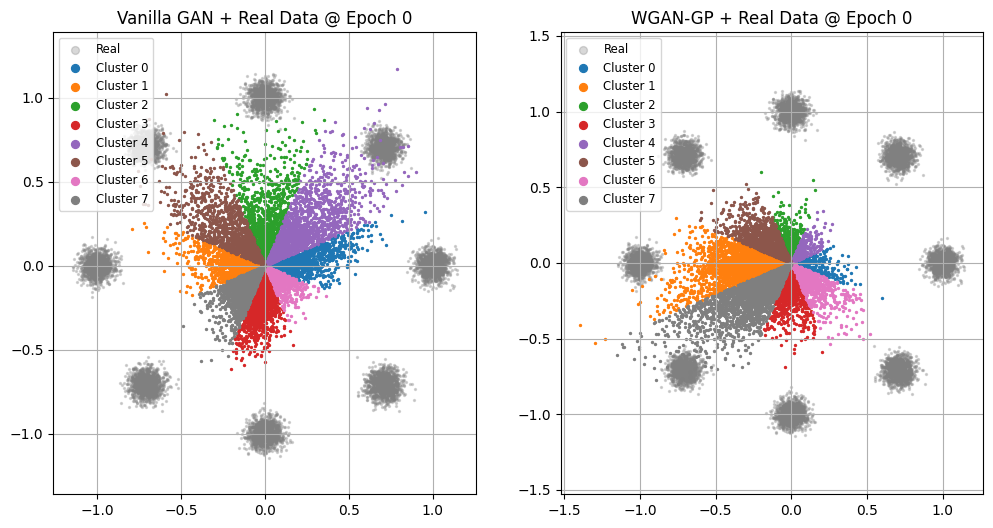

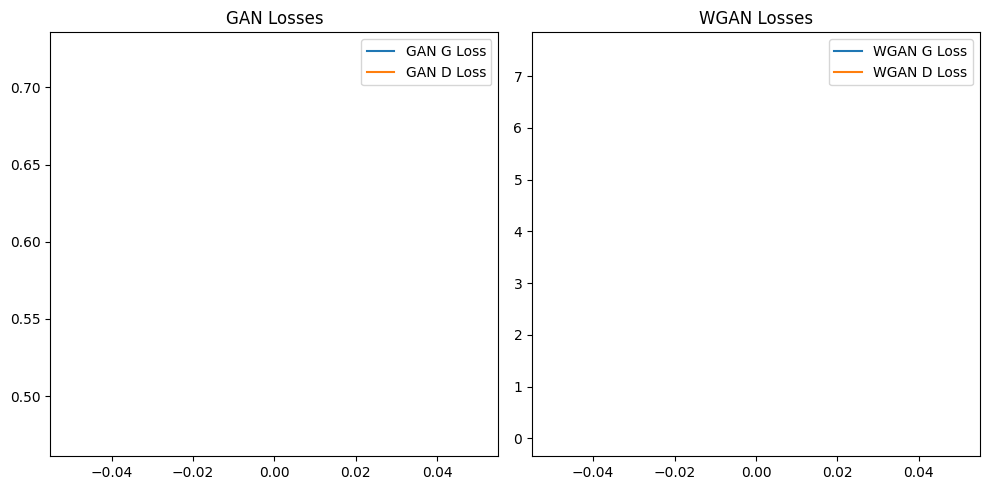

<Figure size 640x480 with 0 Axes>

[Epoch 500] Vanilla D_loss: 0.7199 | G_loss: 0.4725
[Epoch 500] WGAN-GP GP: 0.0136 | C_loss: -1.7055 | G_loss: 0.6182


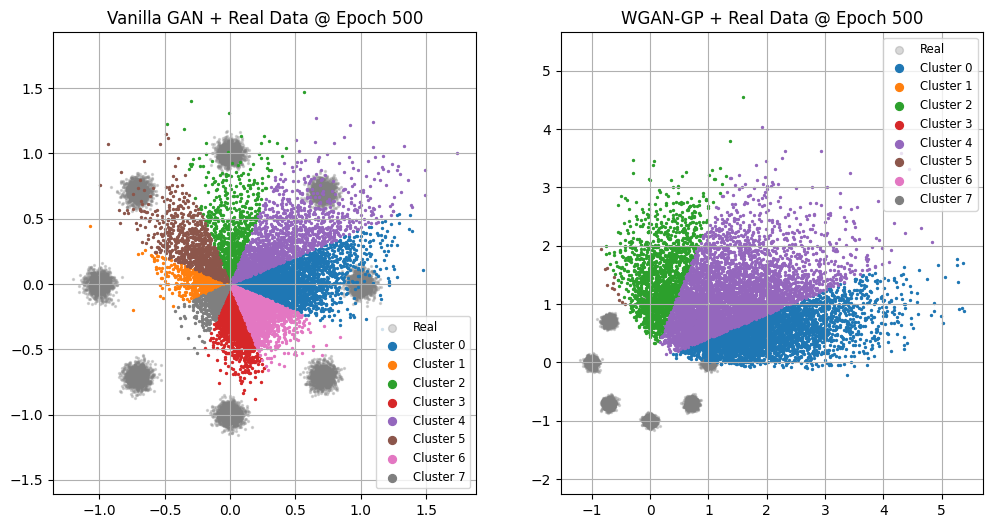

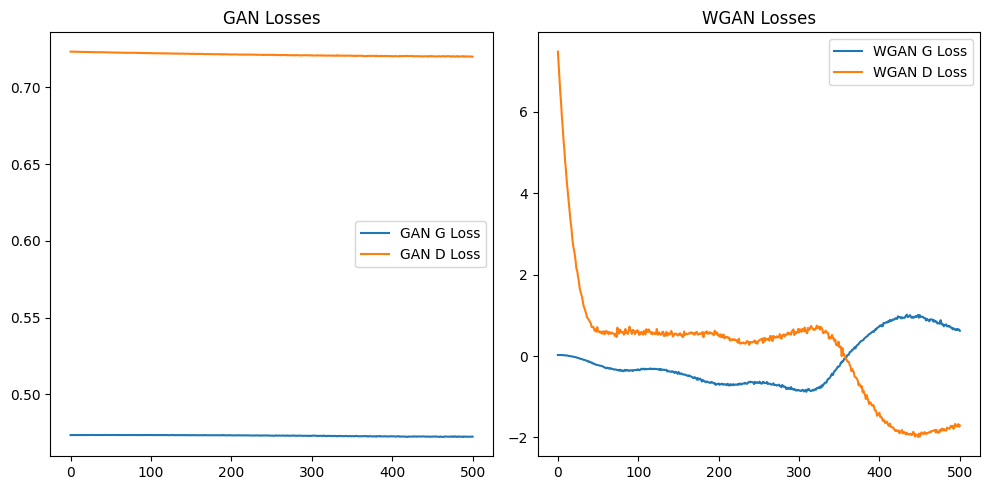

<Figure size 640x480 with 0 Axes>

[Epoch 1000] Vanilla D_loss: 0.7181 | G_loss: 0.4767
[Epoch 1000] WGAN-GP GP: 0.0032 | C_loss: -0.7501 | G_loss: -0.7278


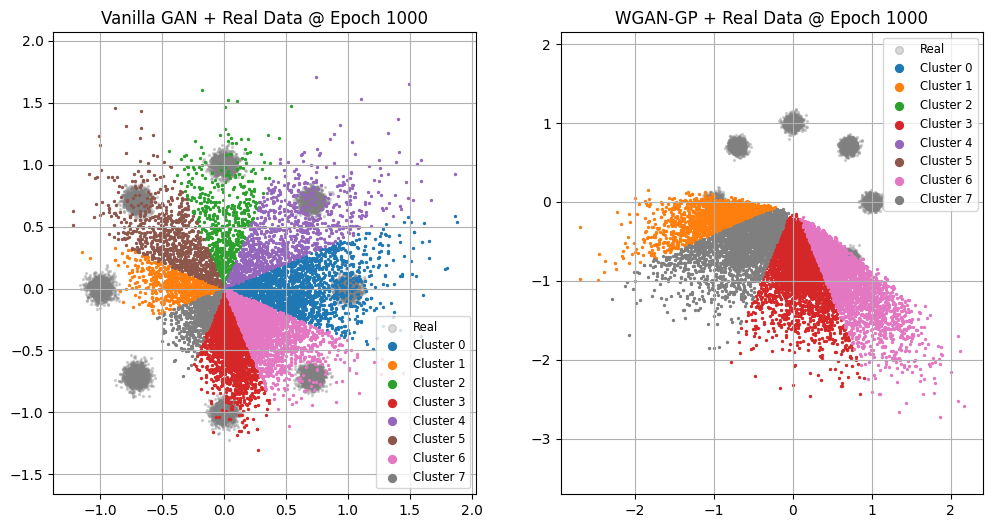

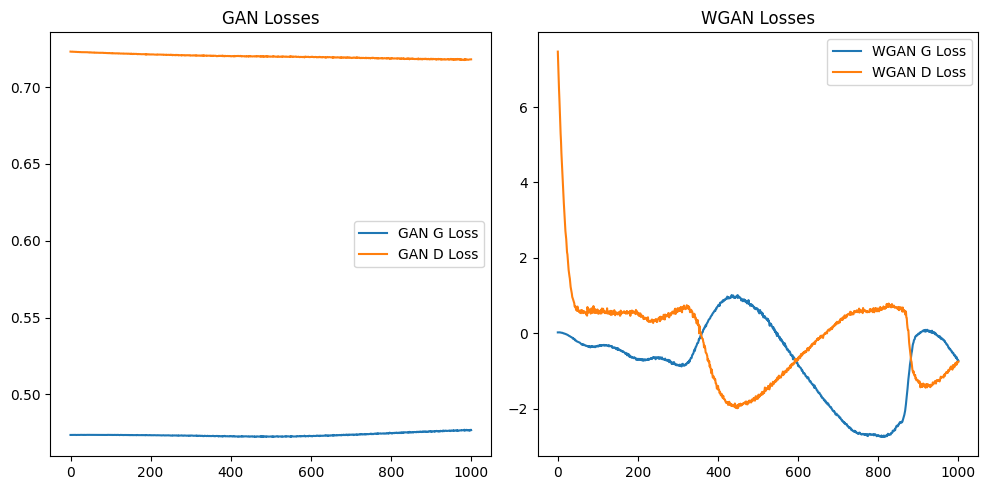

<Figure size 640x480 with 0 Axes>

[Epoch 1500] Vanilla D_loss: 0.7184 | G_loss: 0.4763
[Epoch 1500] WGAN-GP GP: 0.0404 | C_loss: 0.4747 | G_loss: -3.9505


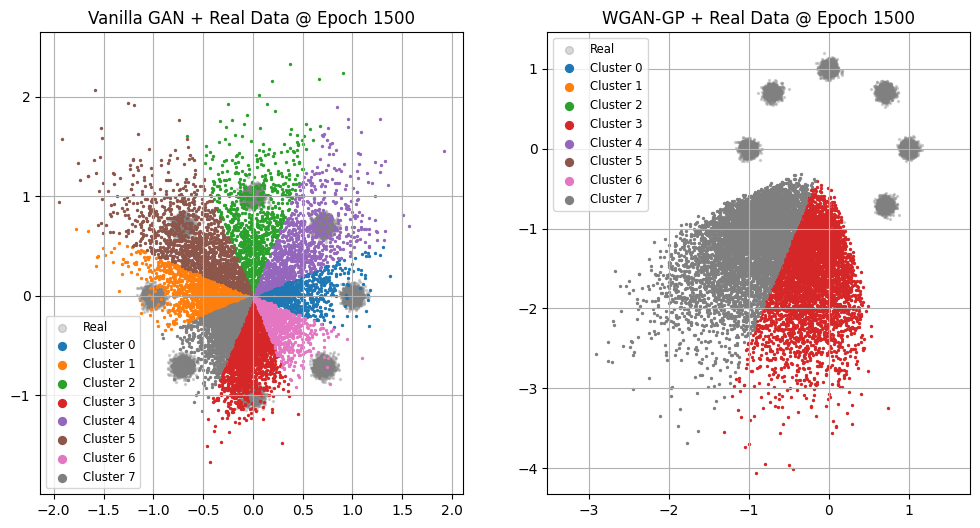

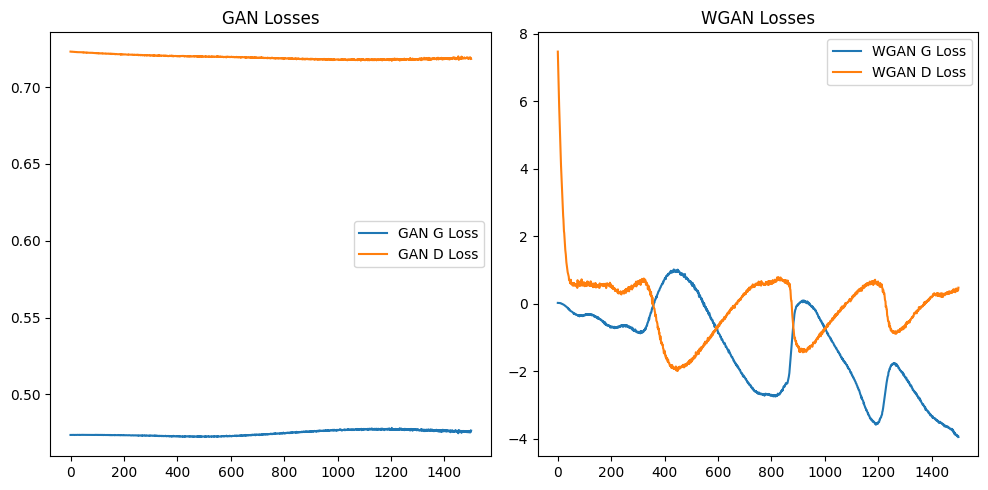

<Figure size 640x480 with 0 Axes>

[Epoch 2000] Vanilla D_loss: 0.7183 | G_loss: 0.4779
[Epoch 2000] WGAN-GP GP: 0.0334 | C_loss: 0.6800 | G_loss: -5.7536


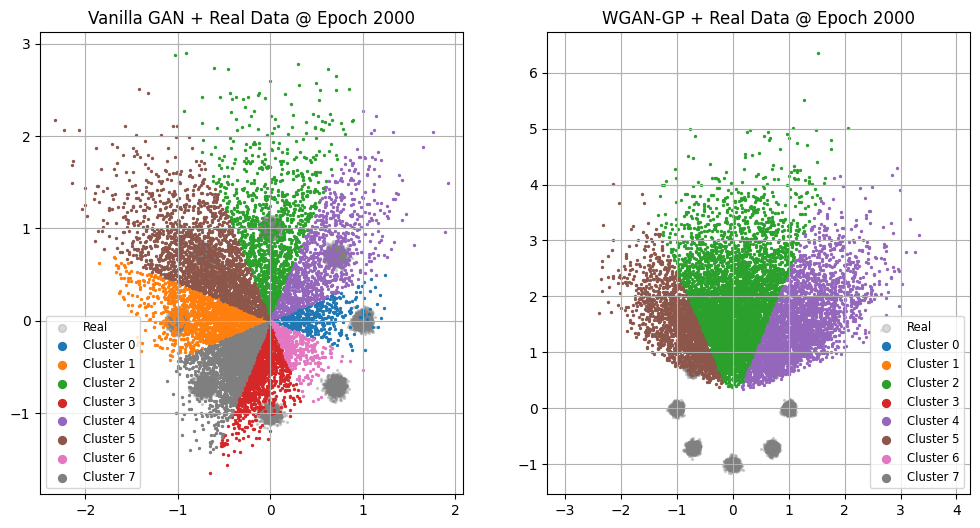

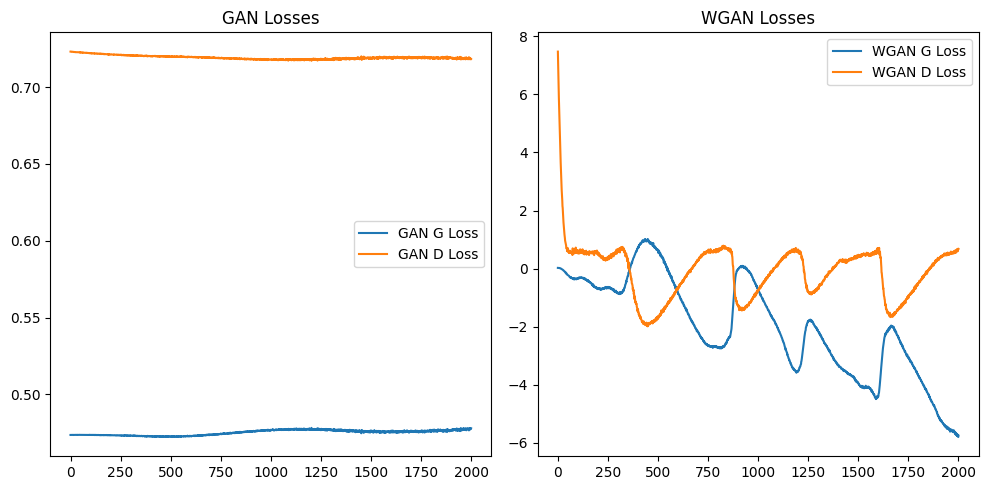

<Figure size 640x480 with 0 Axes>

[Epoch 2500] Vanilla D_loss: 0.7167 | G_loss: 0.4839
[Epoch 2500] WGAN-GP GP: 0.0100 | C_loss: -0.4978 | G_loss: -2.5680


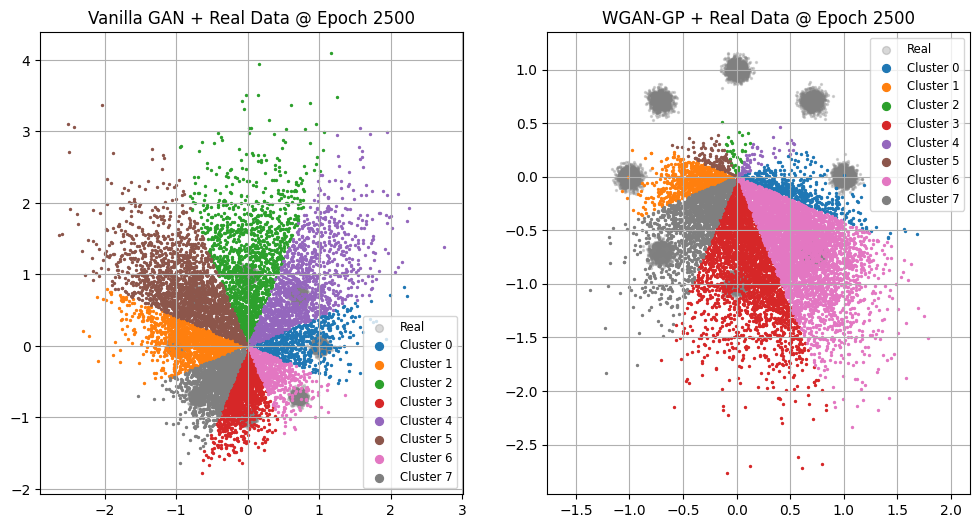

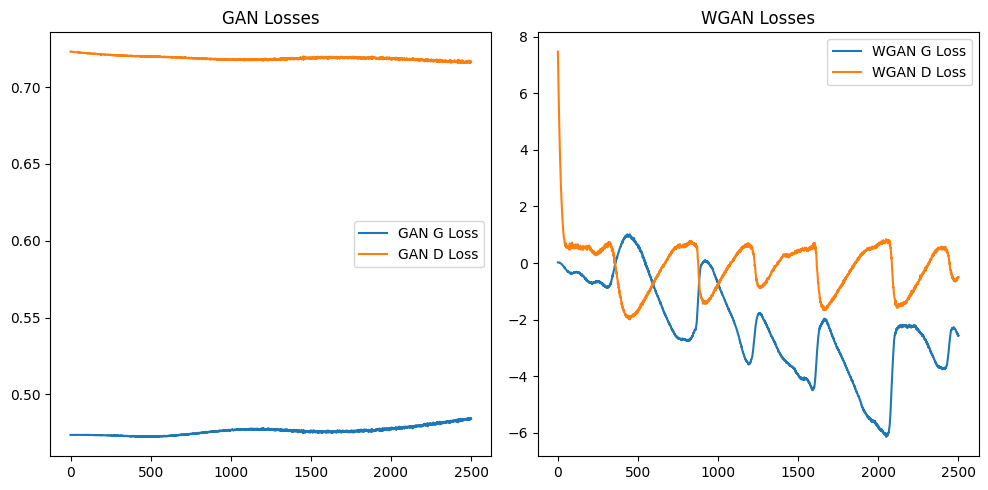

<Figure size 640x480 with 0 Axes>

[Epoch 3000] Vanilla D_loss: 0.7175 | G_loss: 0.4940
[Epoch 3000] WGAN-GP GP: 0.0064 | C_loss: -0.1158 | G_loss: -3.8573


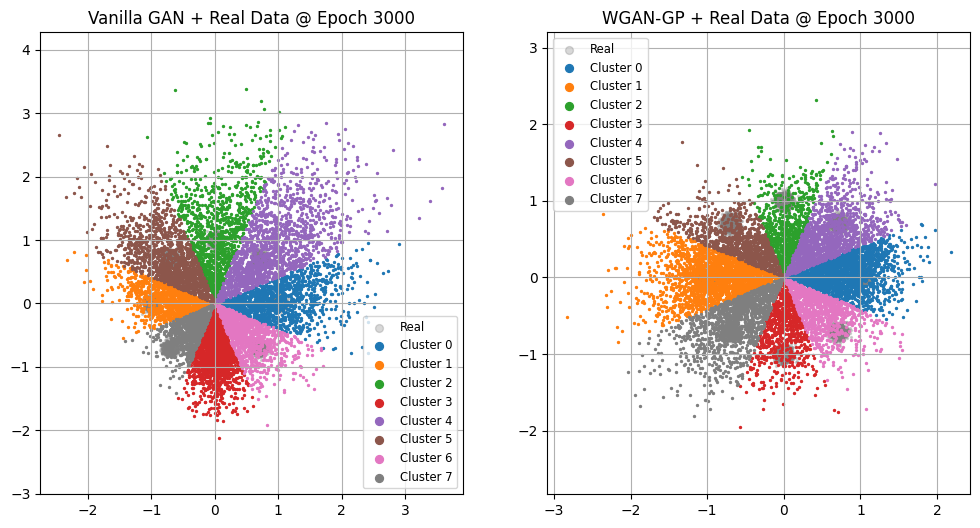

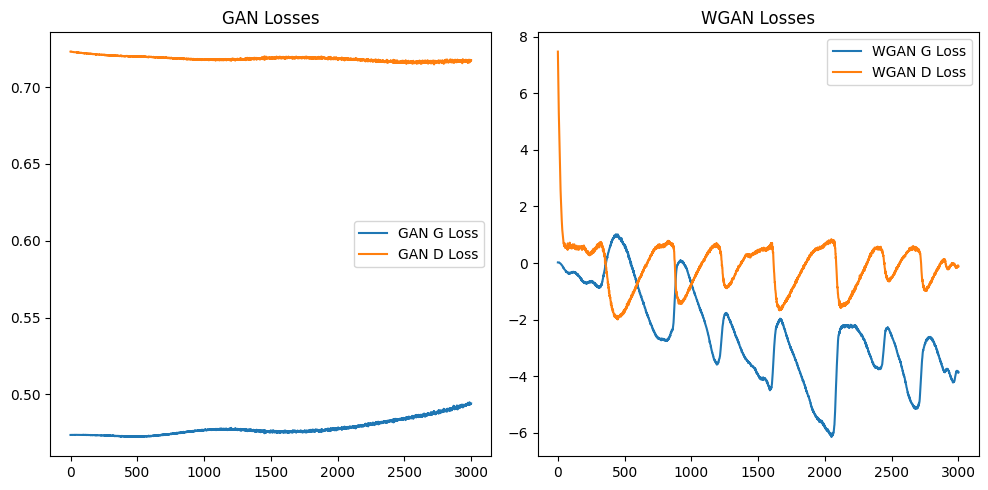

<Figure size 640x480 with 0 Axes>

[Epoch 3500] Vanilla D_loss: 0.7147 | G_loss: 0.5088
[Epoch 3500] WGAN-GP GP: 0.0026 | C_loss: -0.1105 | G_loss: -4.4953


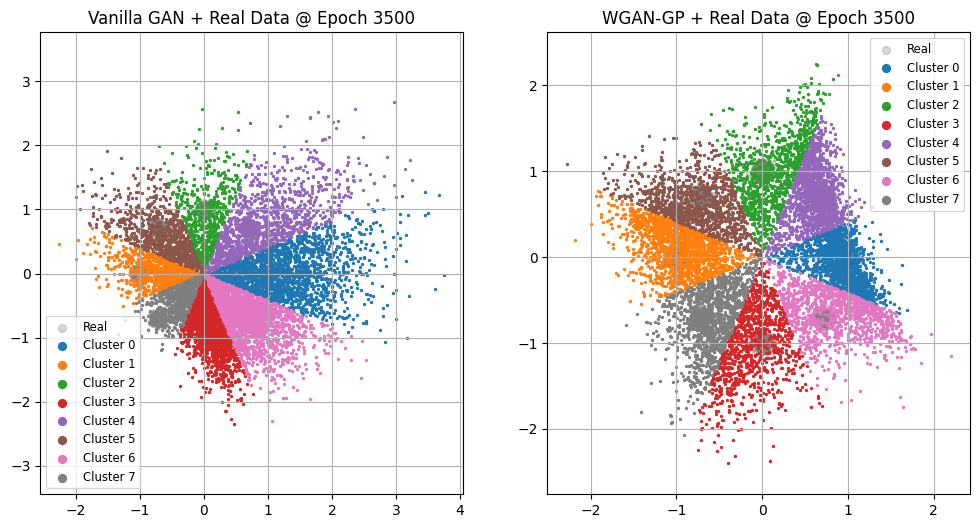

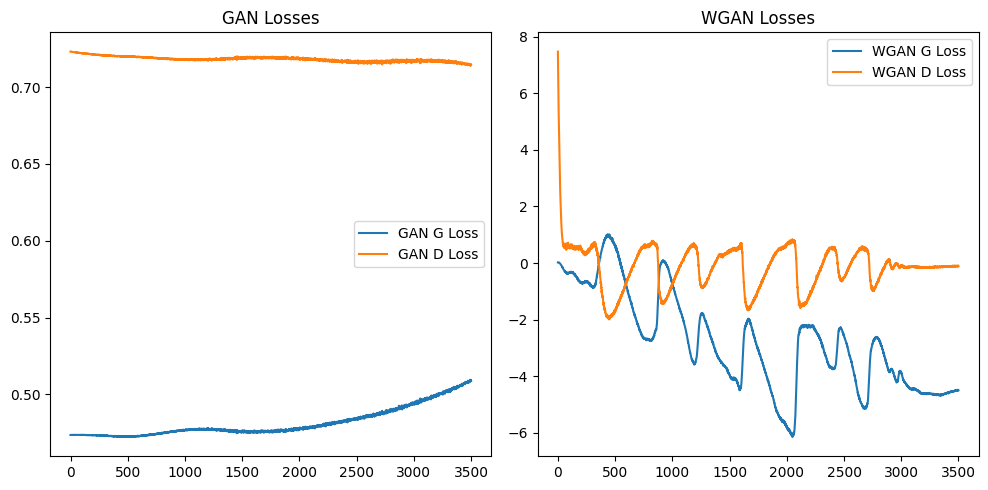

<Figure size 640x480 with 0 Axes>

[Epoch 4000] Vanilla D_loss: 0.7079 | G_loss: 0.5292
[Epoch 4000] WGAN-GP GP: 0.0048 | C_loss: 0.0102 | G_loss: -4.7991


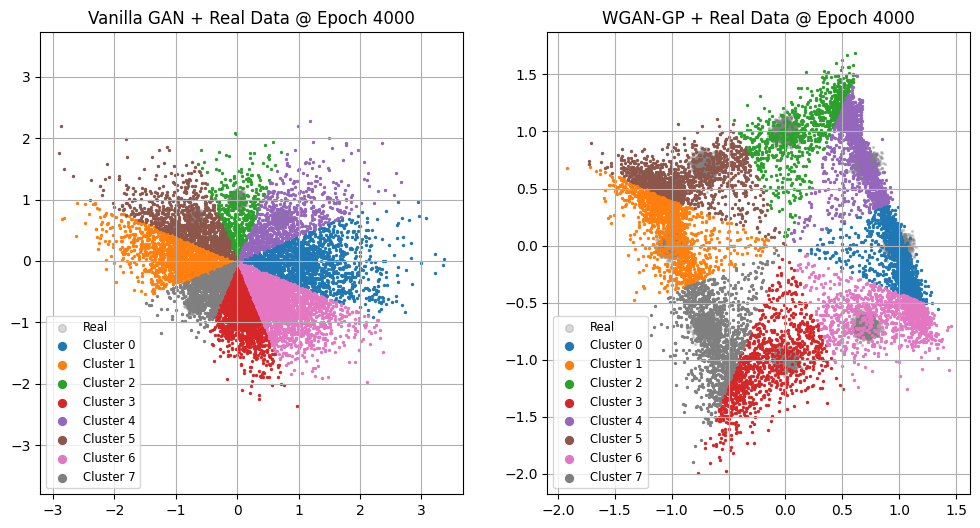

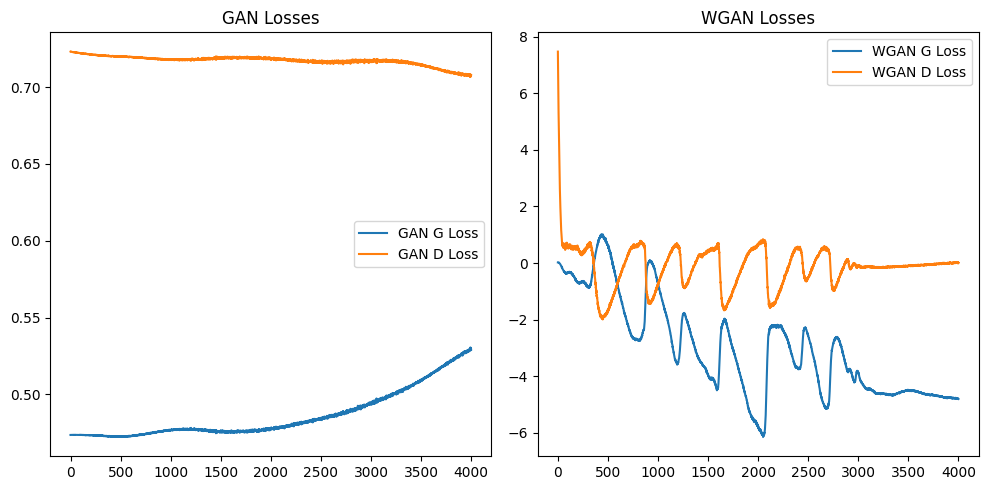

<Figure size 640x480 with 0 Axes>

[Epoch 4500] Vanilla D_loss: 0.7084 | G_loss: 0.5393
[Epoch 4500] WGAN-GP GP: 0.0046 | C_loss: -0.0574 | G_loss: -5.8045


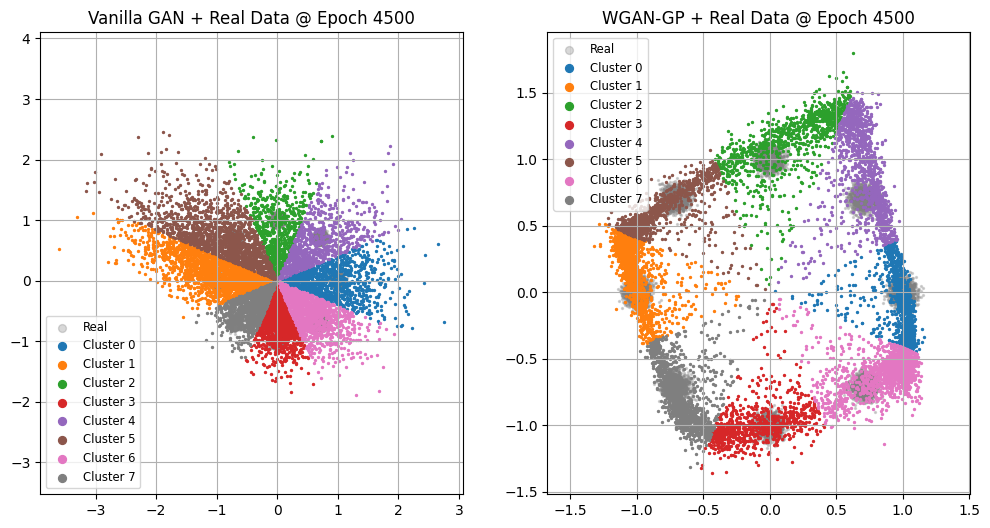

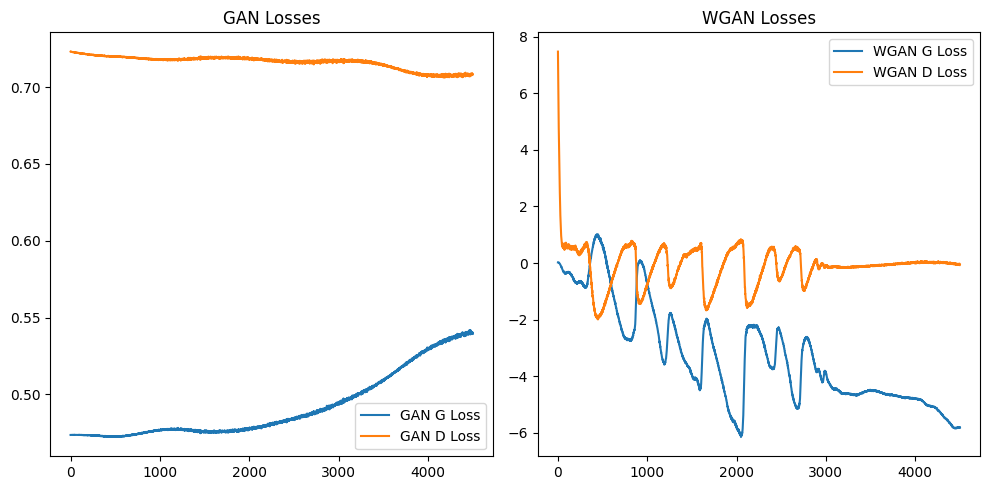

<Figure size 640x480 with 0 Axes>

[Epoch 5000] Vanilla D_loss: 0.7073 | G_loss: 0.5428
[Epoch 5000] WGAN-GP GP: 0.0010 | C_loss: -0.0726 | G_loss: -6.3002


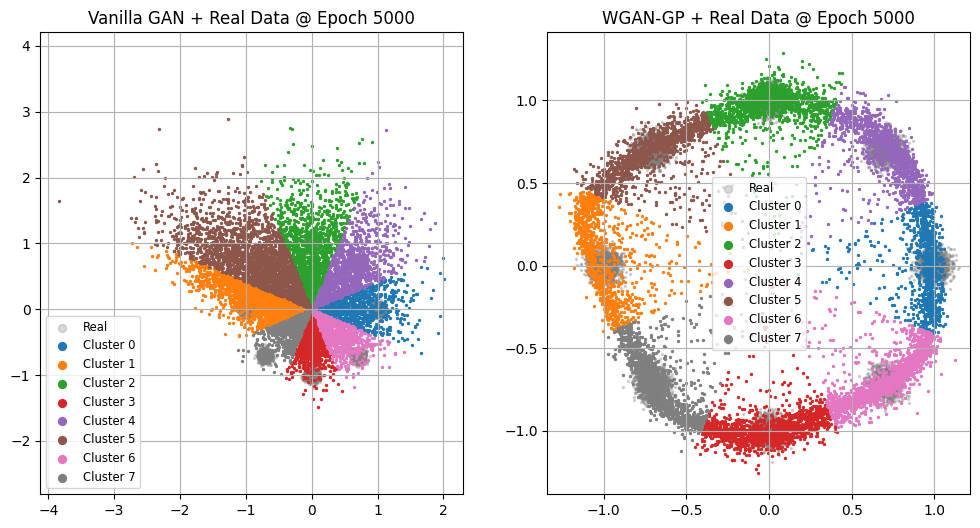

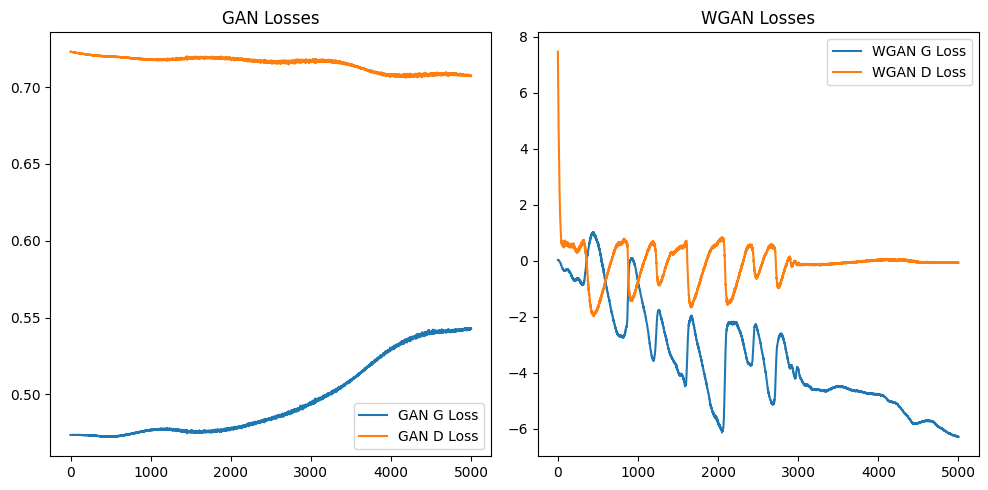

<Figure size 640x480 with 0 Axes>

[Epoch 5500] Vanilla D_loss: 0.7036 | G_loss: 0.5471
[Epoch 5500] WGAN-GP GP: 0.0008 | C_loss: -0.0673 | G_loss: -6.3247


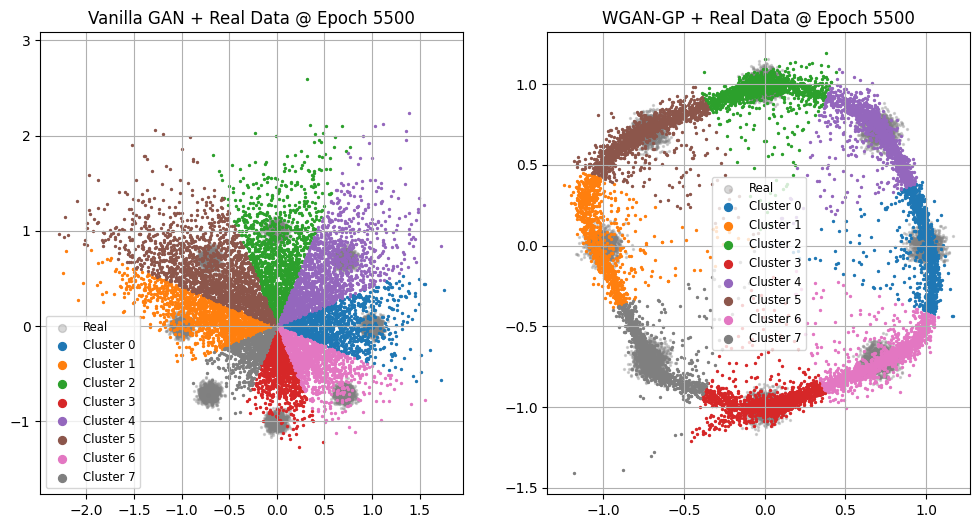

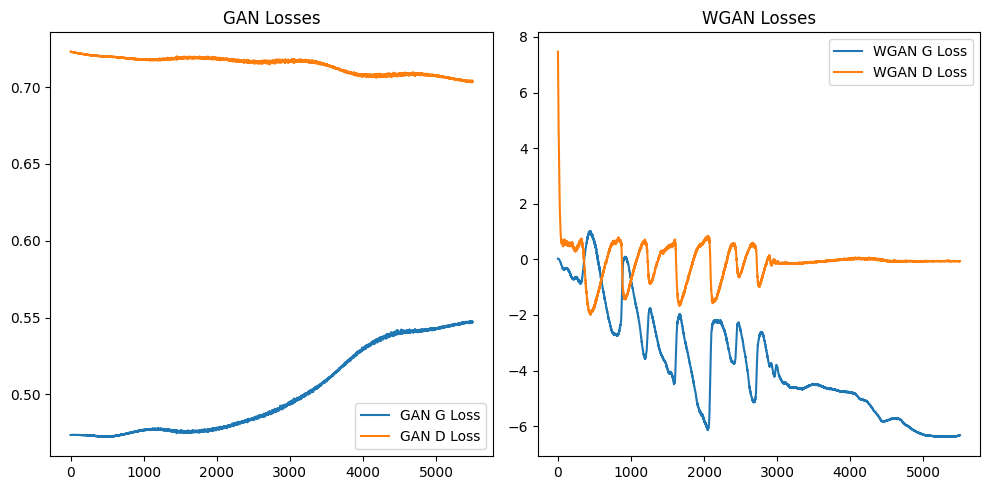

<Figure size 640x480 with 0 Axes>

[Epoch 6000] Vanilla D_loss: 0.7034 | G_loss: 0.5509
[Epoch 6000] WGAN-GP GP: 0.0017 | C_loss: -0.0651 | G_loss: -5.8643


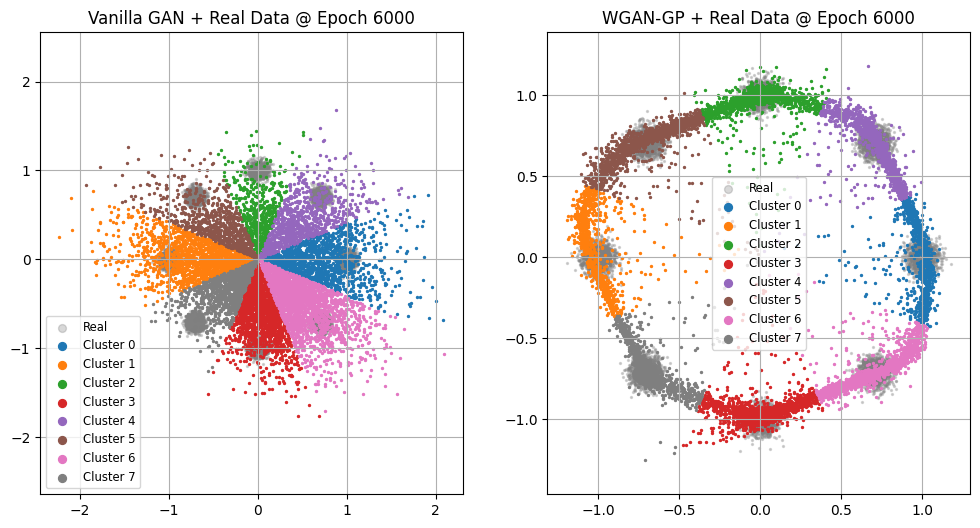

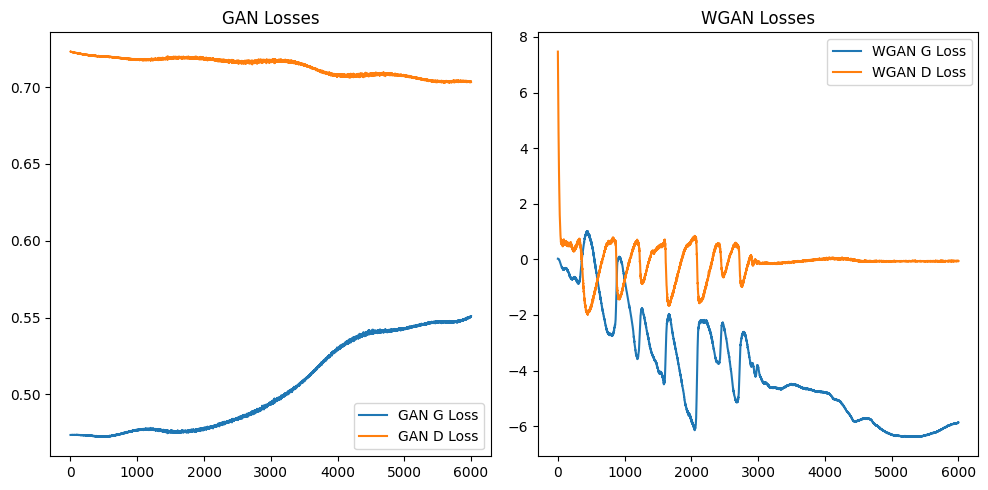

<Figure size 640x480 with 0 Axes>

[Epoch 6500] Vanilla D_loss: 0.6998 | G_loss: 0.5646
[Epoch 6500] WGAN-GP GP: 0.0018 | C_loss: -0.0549 | G_loss: -5.9614


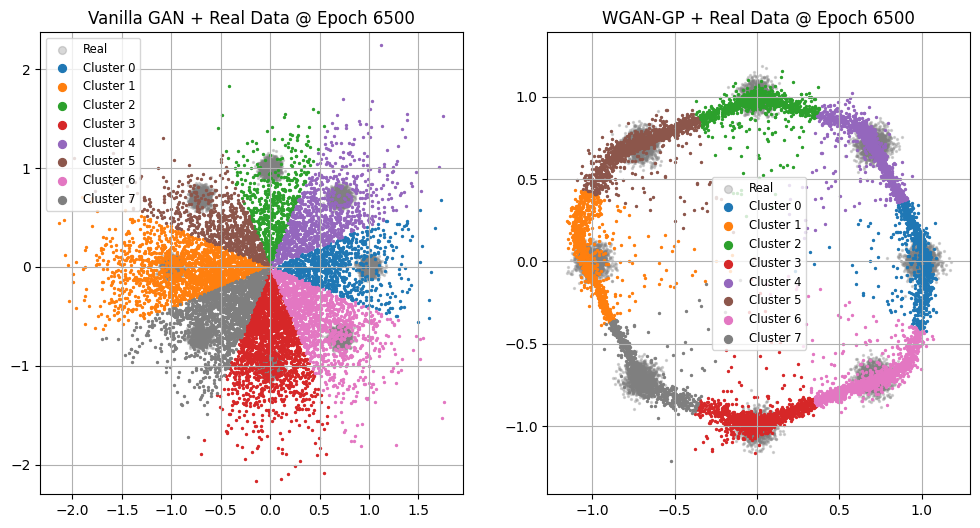

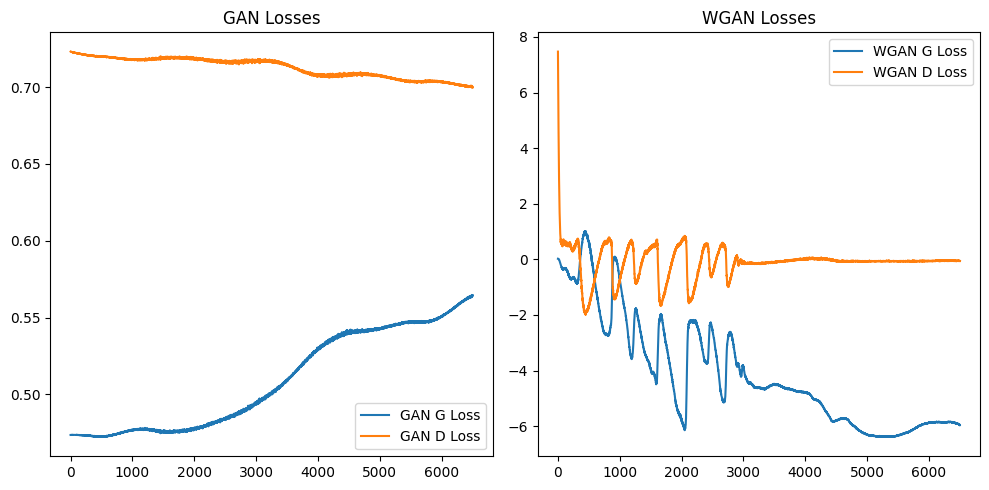

<Figure size 640x480 with 0 Axes>

[Epoch 7000] Vanilla D_loss: 0.7007 | G_loss: 0.5668
[Epoch 7000] WGAN-GP GP: 0.0020 | C_loss: -0.0489 | G_loss: -6.0974


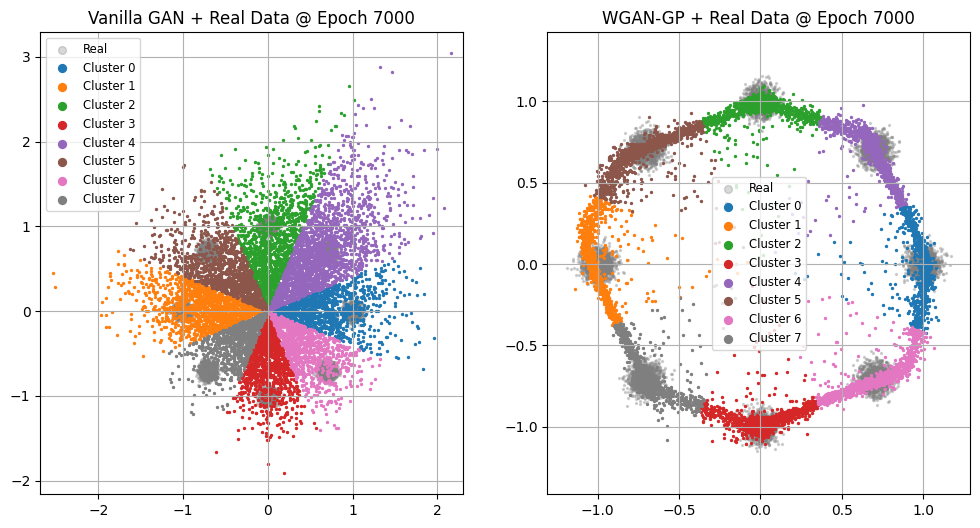

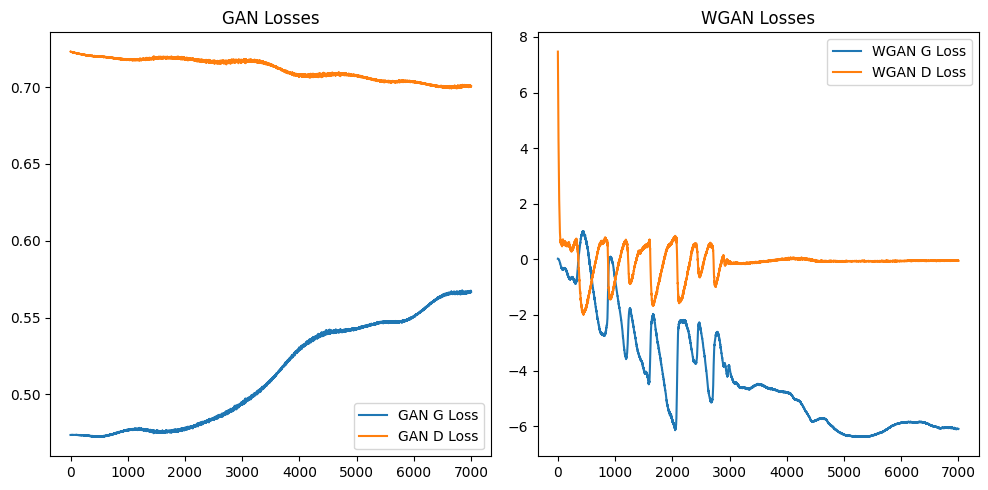

<Figure size 640x480 with 0 Axes>

[Epoch 7500] Vanilla D_loss: 0.6976 | G_loss: 0.5740
[Epoch 7500] WGAN-GP GP: 0.0013 | C_loss: -0.0459 | G_loss: -5.9564


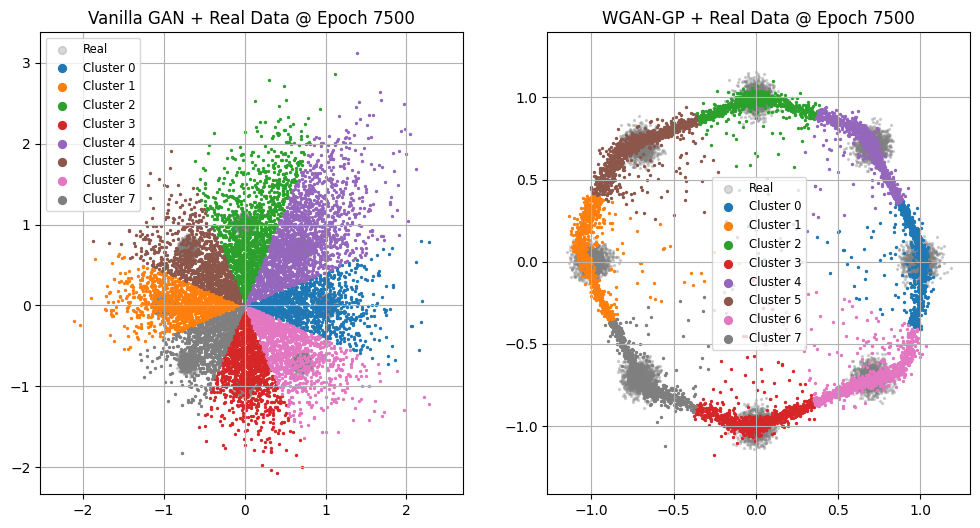

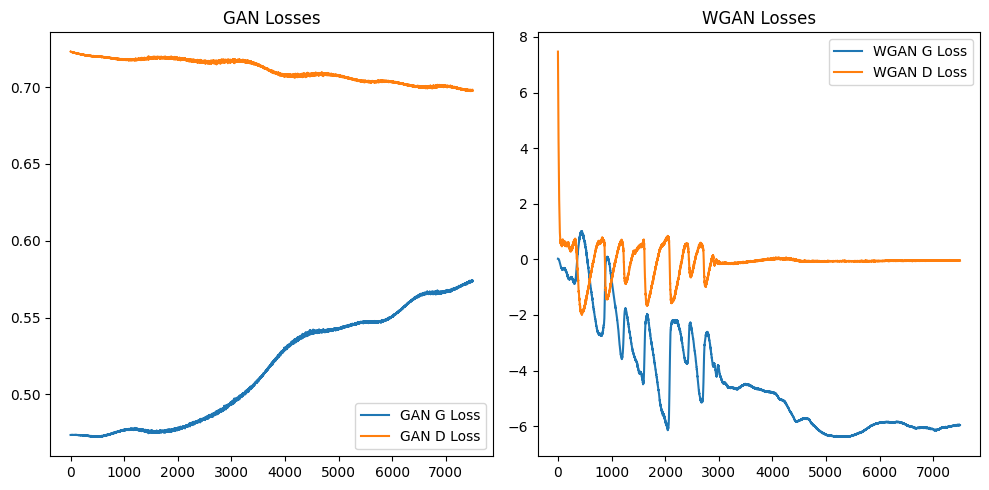

<Figure size 640x480 with 0 Axes>

[Epoch 8000] Vanilla D_loss: 0.6984 | G_loss: 0.5864
[Epoch 8000] WGAN-GP GP: 0.0016 | C_loss: -0.0352 | G_loss: -6.1046


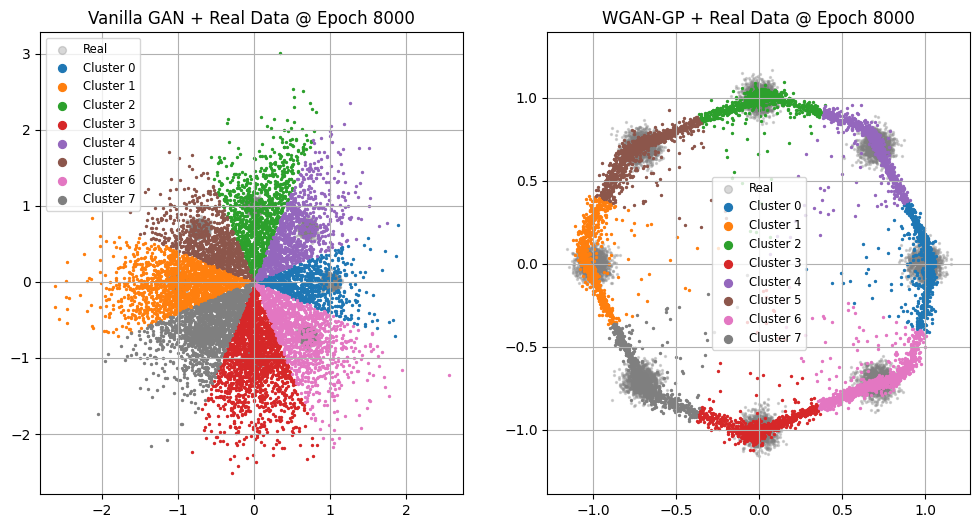

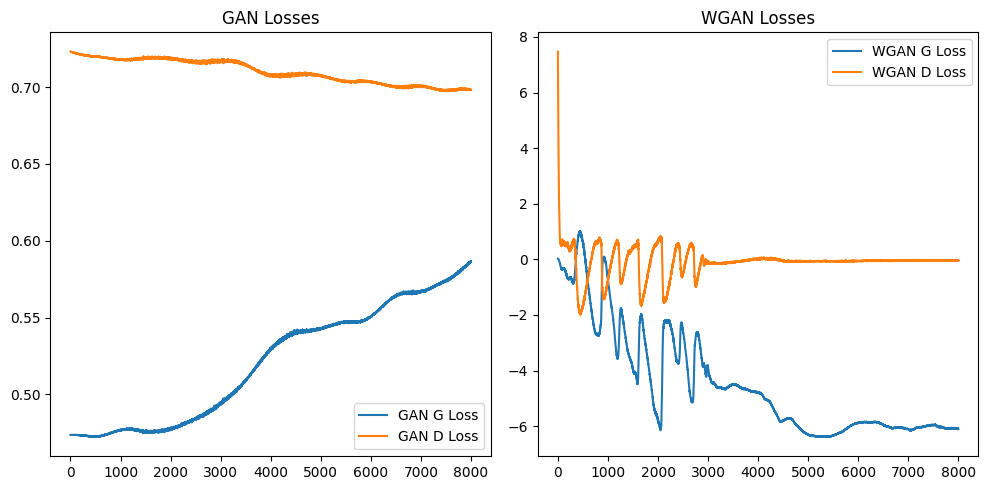

<Figure size 640x480 with 0 Axes>

[Epoch 8500] Vanilla D_loss: 0.6963 | G_loss: 0.6034
[Epoch 8500] WGAN-GP GP: 0.0013 | C_loss: -0.0290 | G_loss: -6.2696


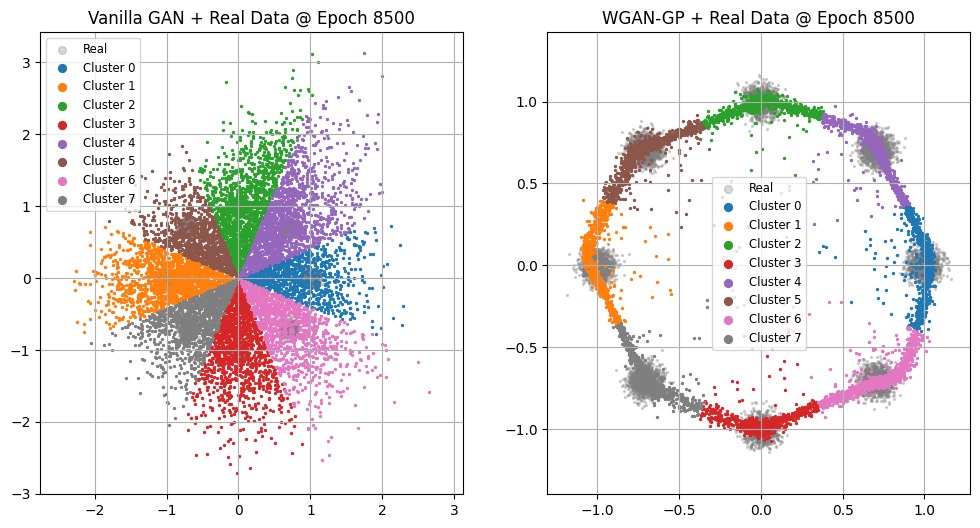

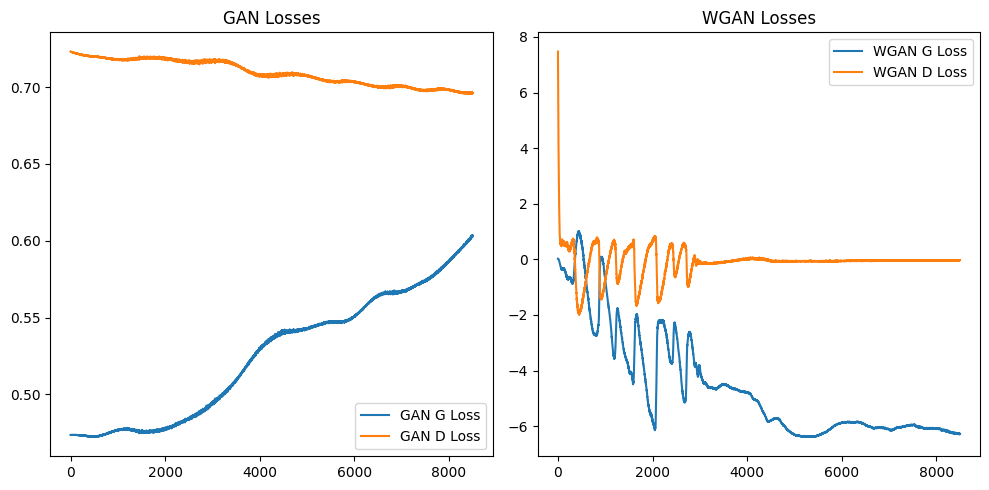

<Figure size 640x480 with 0 Axes>

[Epoch 9000] Vanilla D_loss: 0.6950 | G_loss: 0.6129
[Epoch 9000] WGAN-GP GP: 0.0011 | C_loss: -0.0295 | G_loss: -6.3445


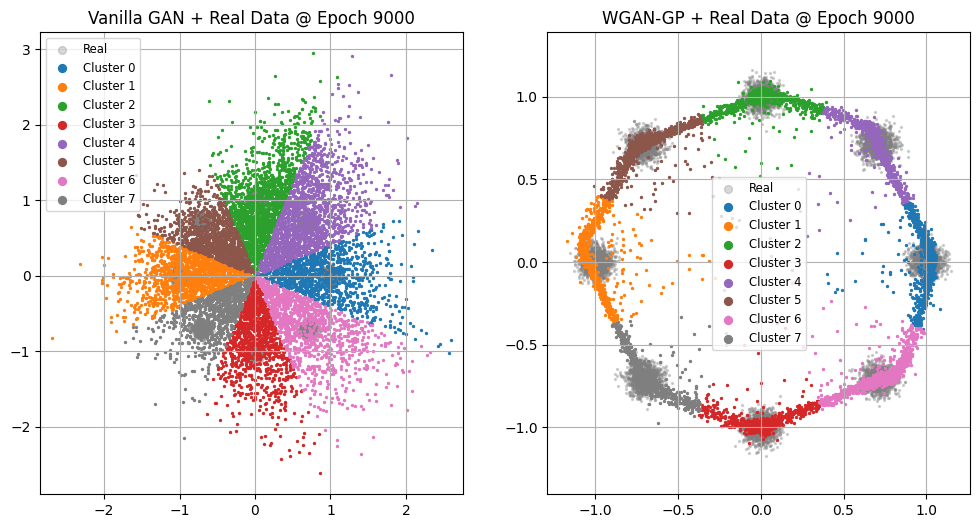

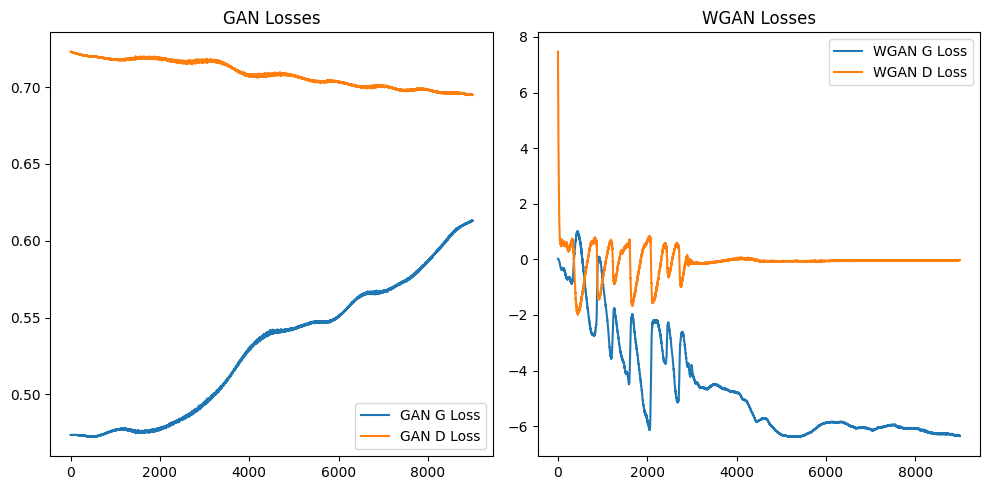

<Figure size 640x480 with 0 Axes>

[Epoch 9500] Vanilla D_loss: 0.6943 | G_loss: 0.6232
[Epoch 9500] WGAN-GP GP: 0.0013 | C_loss: -0.0184 | G_loss: -6.4629


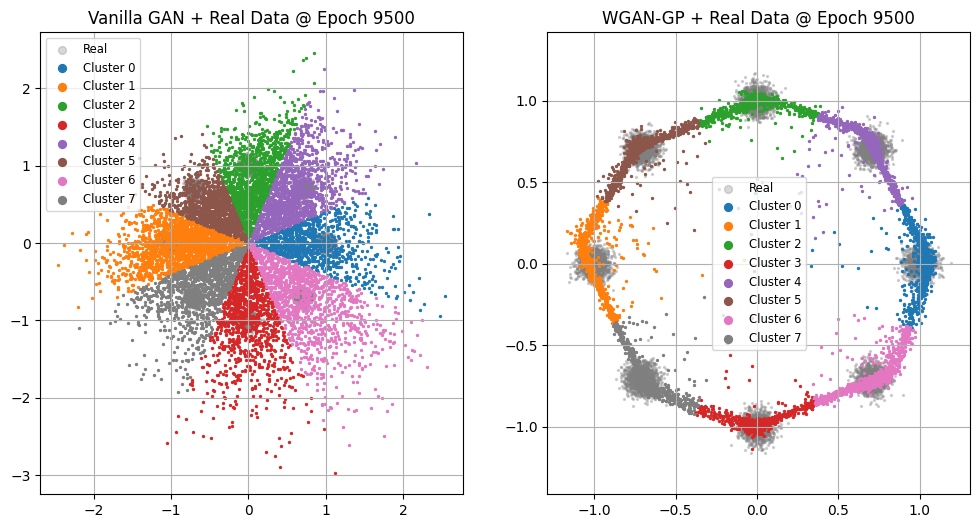

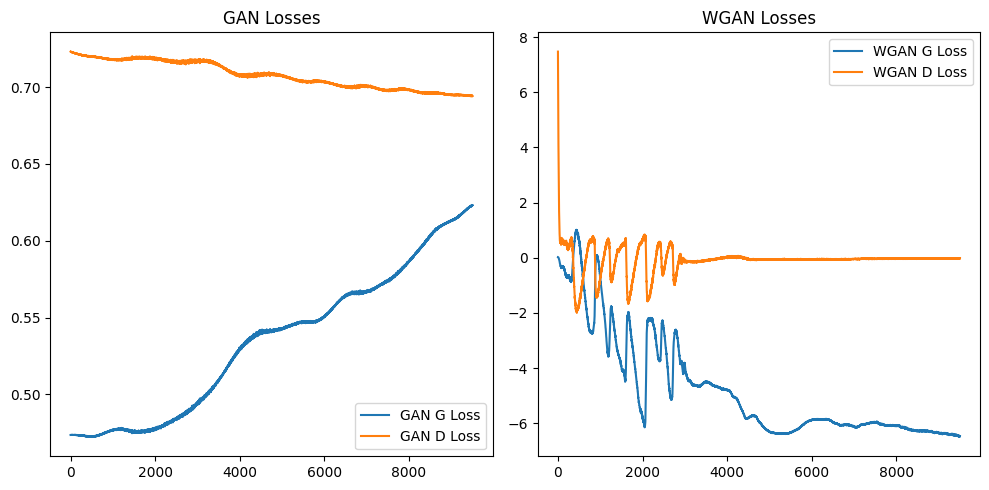

<Figure size 640x480 with 0 Axes>

[Epoch 10000] Vanilla D_loss: 0.6936 | G_loss: 0.6301
[Epoch 10000] WGAN-GP GP: 0.0017 | C_loss: -0.0051 | G_loss: -6.6263


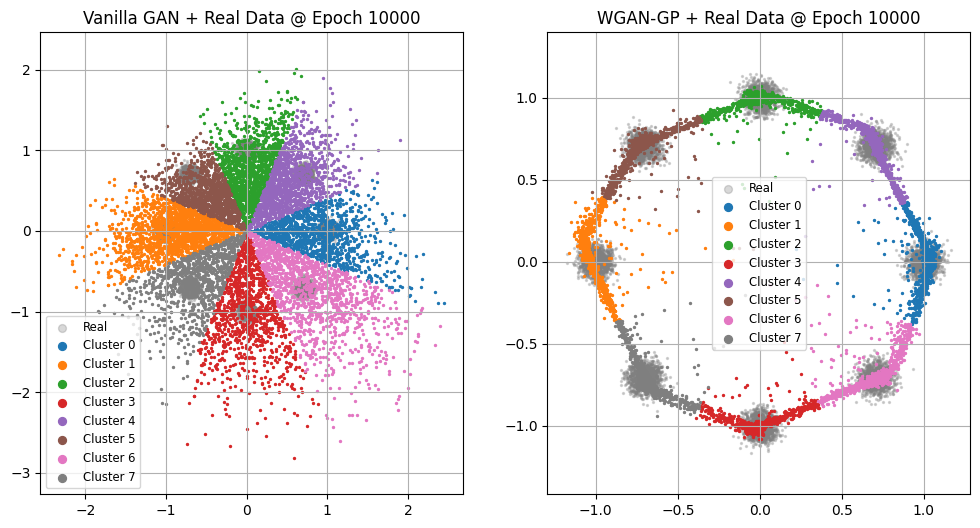

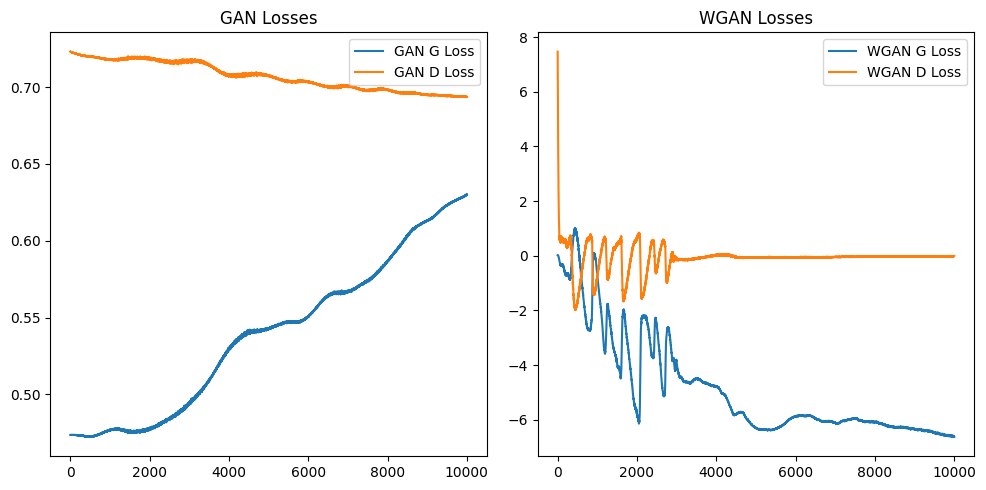

<Figure size 640x480 with 0 Axes>

[Epoch 10500] Vanilla D_loss: 0.6932 | G_loss: 0.6382
[Epoch 10500] WGAN-GP GP: 0.0012 | C_loss: -0.0070 | G_loss: -6.6821


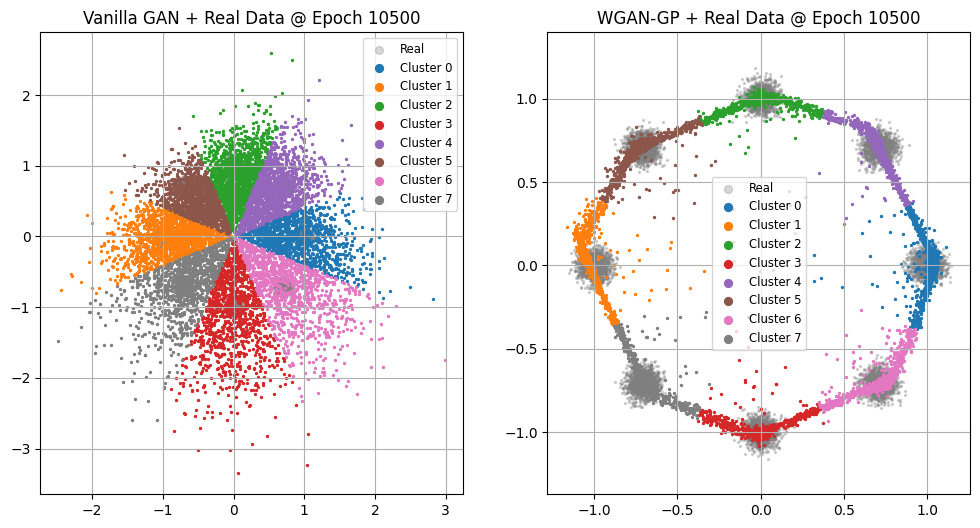

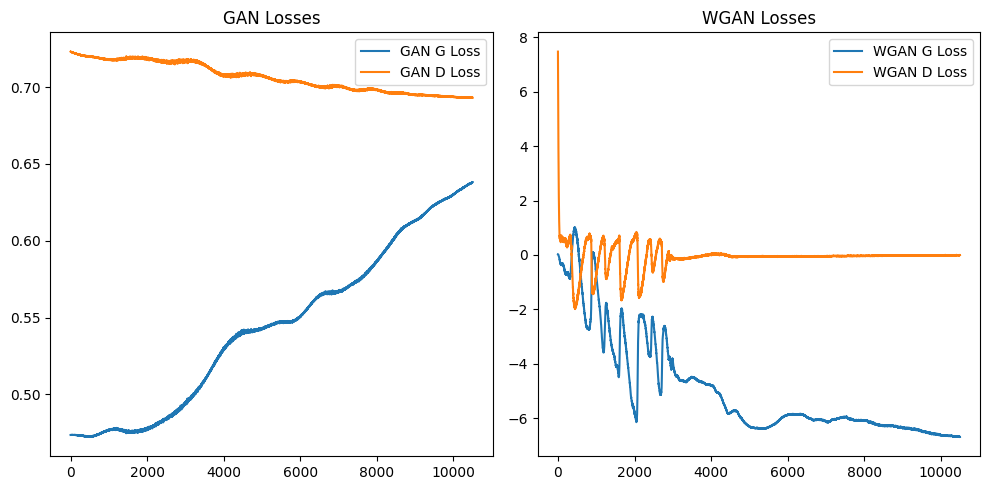

<Figure size 640x480 with 0 Axes>

[Epoch 11000] Vanilla D_loss: 0.6926 | G_loss: 0.6459
[Epoch 11000] WGAN-GP GP: 0.0013 | C_loss: 0.0003 | G_loss: -6.7491


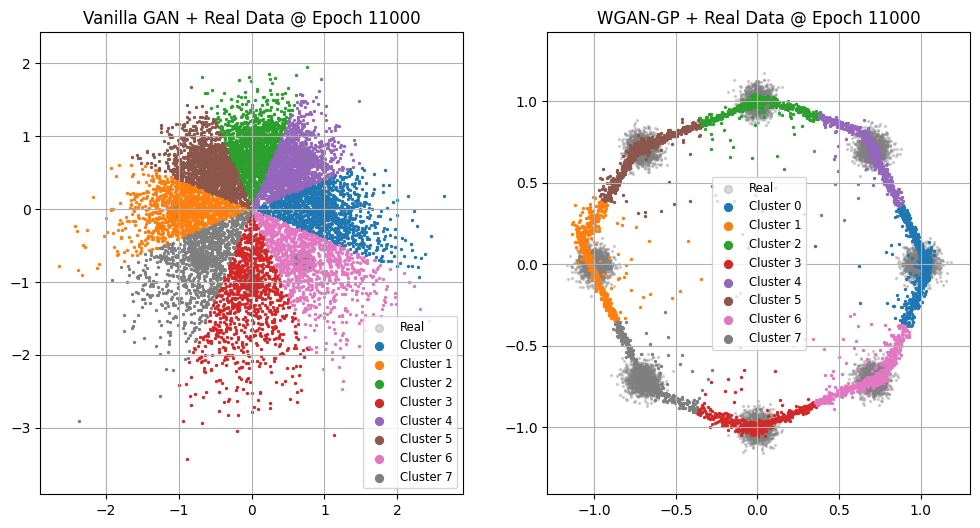

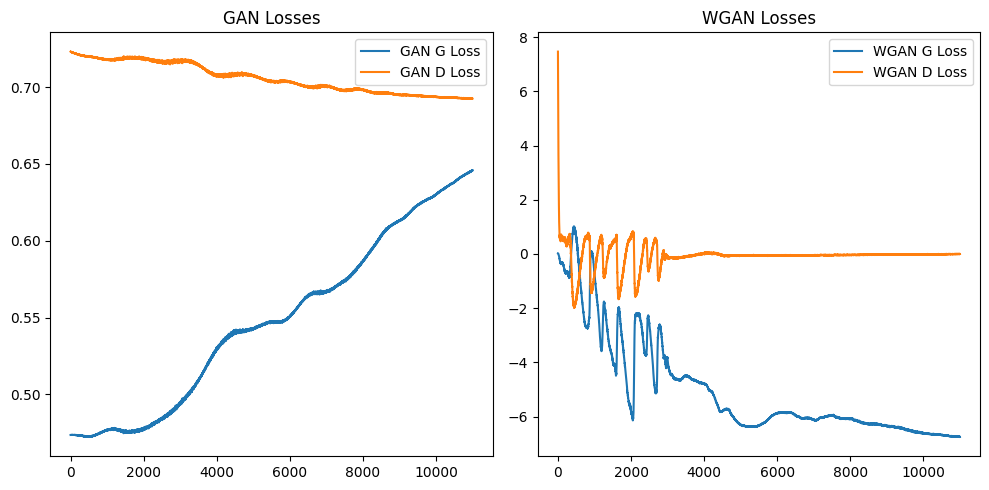

<Figure size 640x480 with 0 Axes>

[Epoch 11500] Vanilla D_loss: 0.6923 | G_loss: 0.6516
[Epoch 11500] WGAN-GP GP: 0.0011 | C_loss: 0.0041 | G_loss: -6.7968


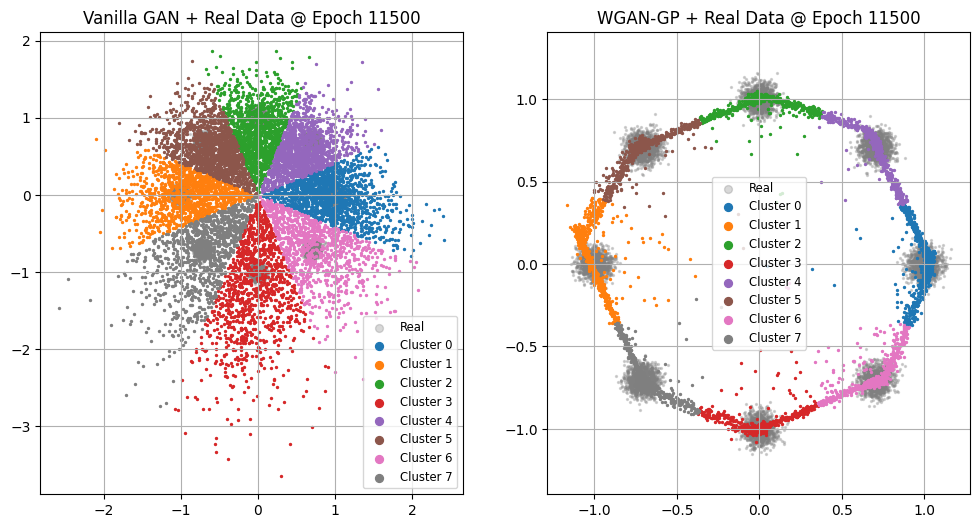

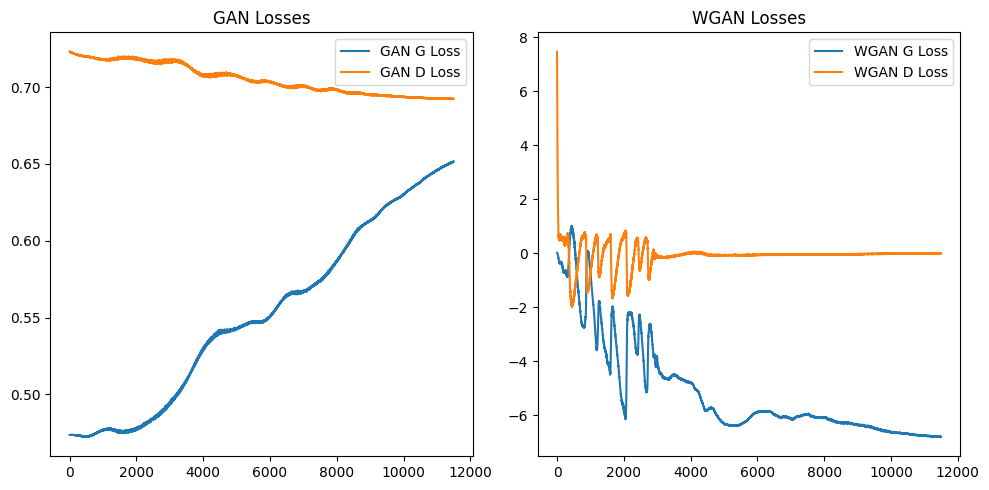

<Figure size 640x480 with 0 Axes>

[Epoch 12000] Vanilla D_loss: 0.6922 | G_loss: 0.6552
[Epoch 12000] WGAN-GP GP: 0.0012 | C_loss: 0.0064 | G_loss: -6.8141


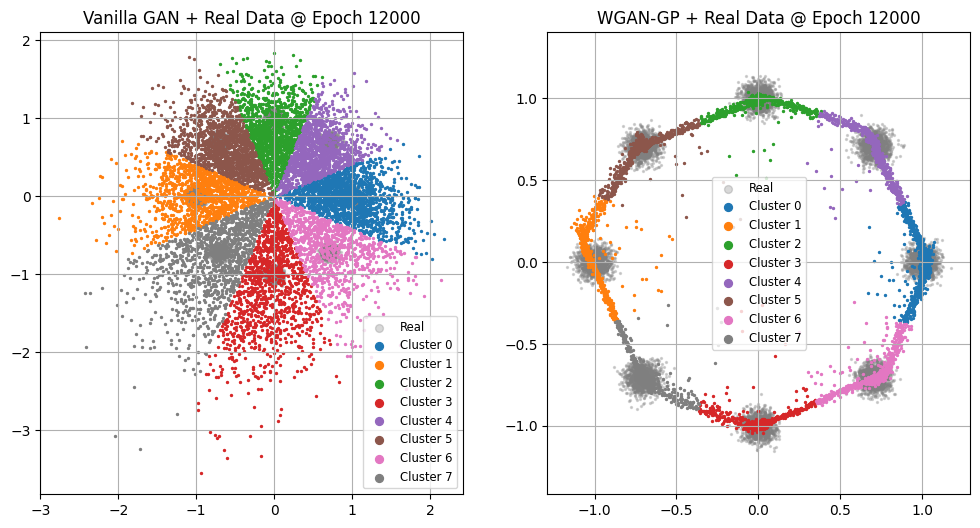

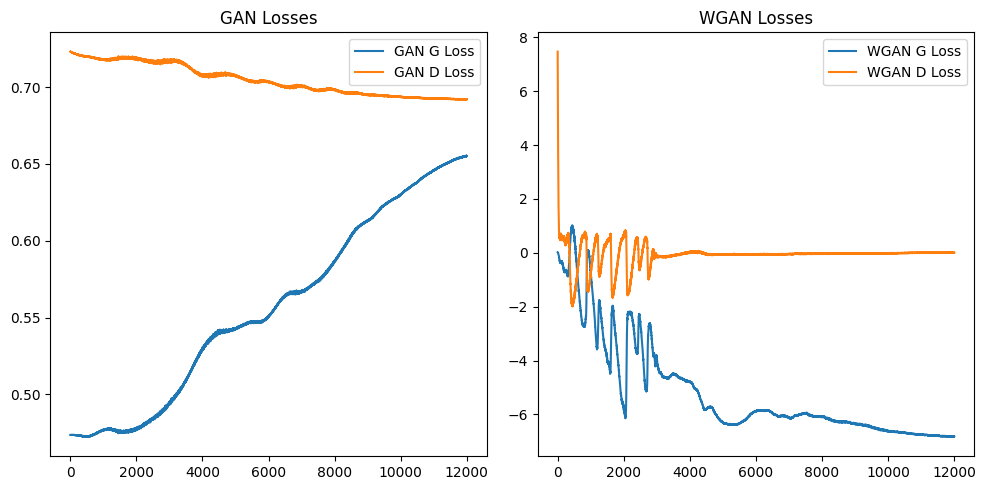

<Figure size 640x480 with 0 Axes>

[Epoch 12500] Vanilla D_loss: 0.6919 | G_loss: 0.6559
[Epoch 12500] WGAN-GP GP: 0.0007 | C_loss: 0.0046 | G_loss: -6.8341


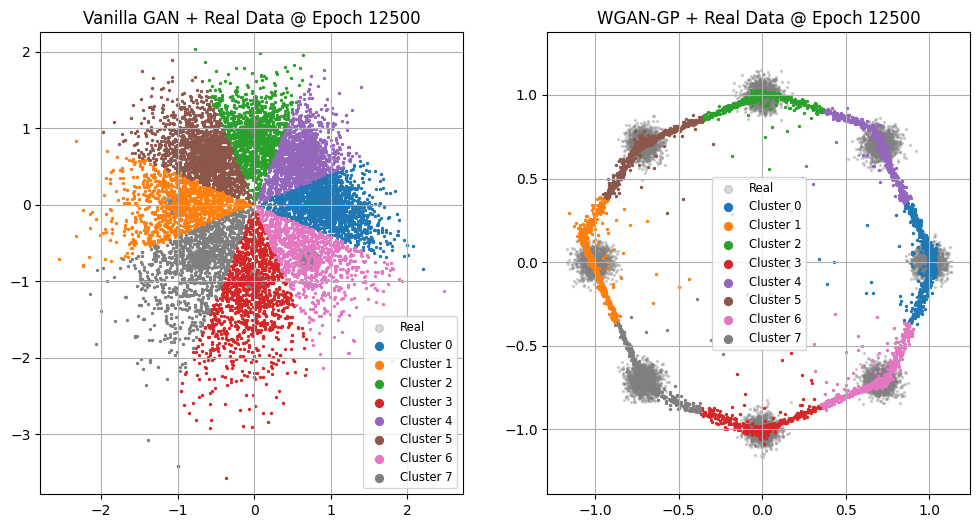

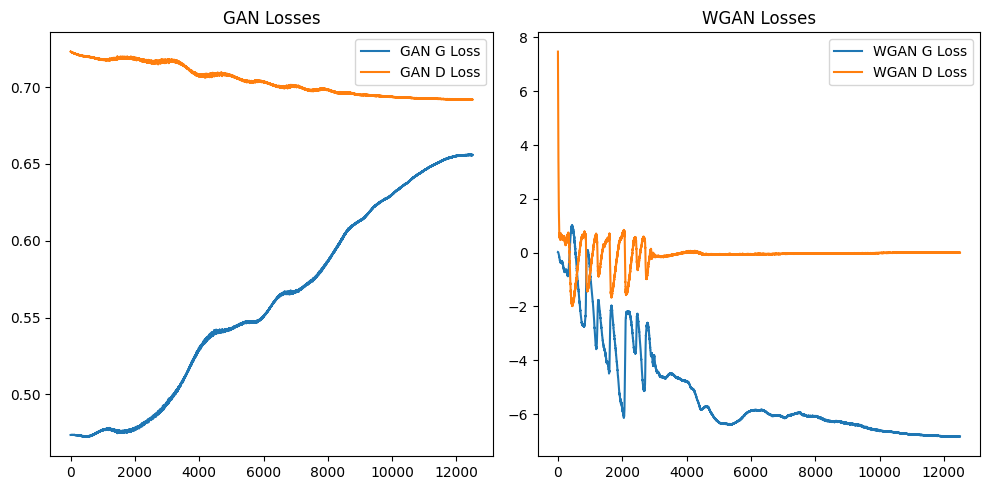

<Figure size 640x480 with 0 Axes>

[Epoch 13000] Vanilla D_loss: 0.6918 | G_loss: 0.6560
[Epoch 13000] WGAN-GP GP: 0.0008 | C_loss: 0.0079 | G_loss: -6.8728


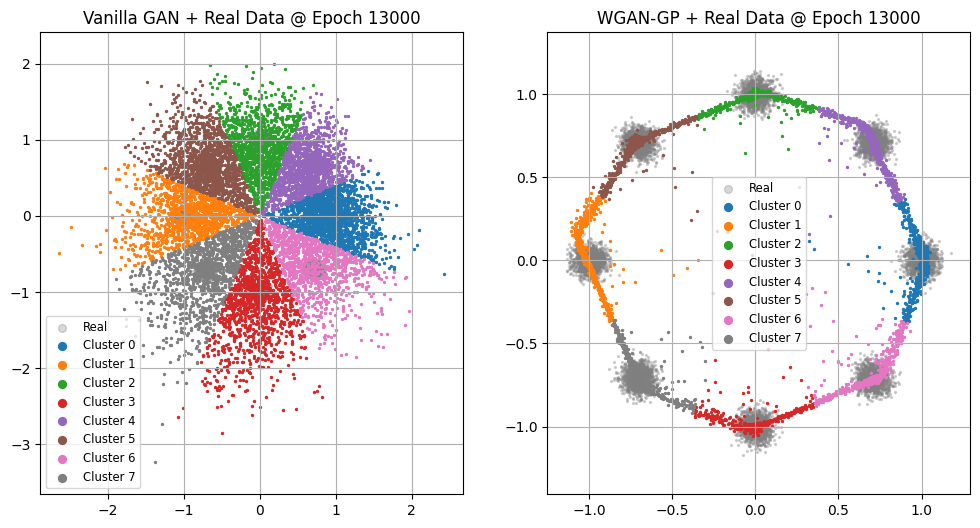

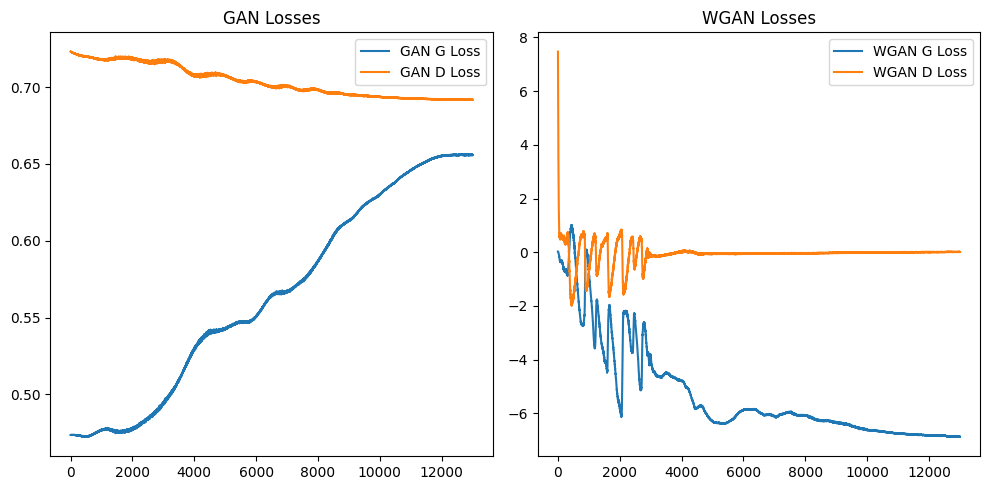

<Figure size 640x480 with 0 Axes>

[Epoch 13500] Vanilla D_loss: 0.6917 | G_loss: 0.6559
[Epoch 13500] WGAN-GP GP: 0.0006 | C_loss: 0.0125 | G_loss: -6.8852


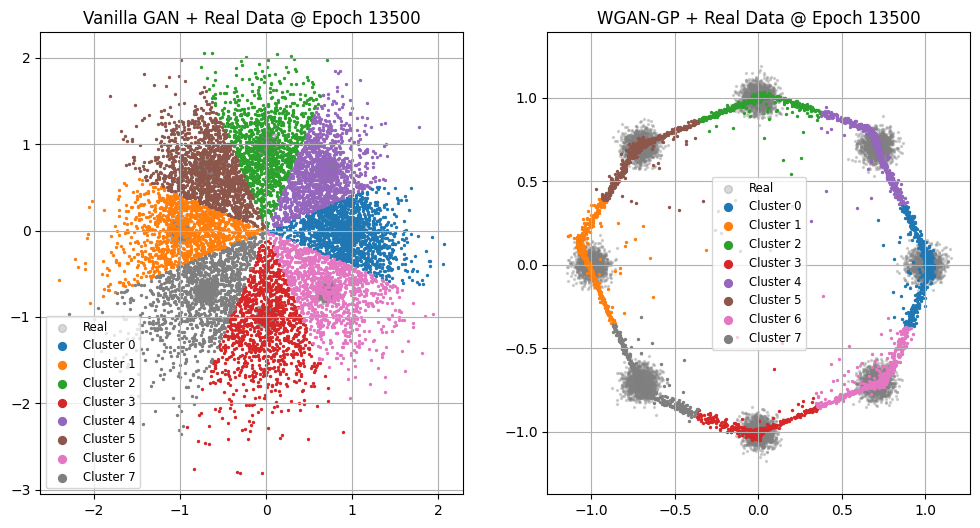

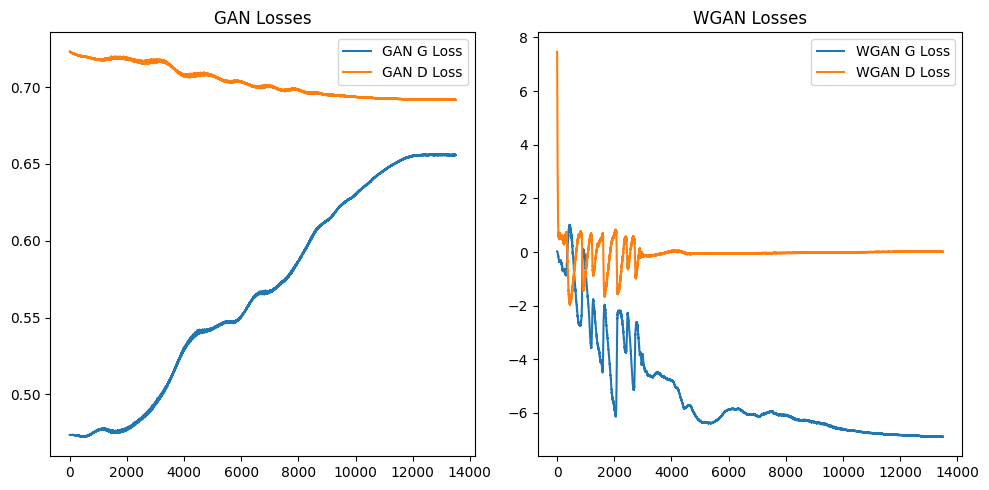

<Figure size 640x480 with 0 Axes>

[Epoch 14000] Vanilla D_loss: 0.6917 | G_loss: 0.6555
[Epoch 14000] WGAN-GP GP: 0.0007 | C_loss: 0.0086 | G_loss: -6.9076


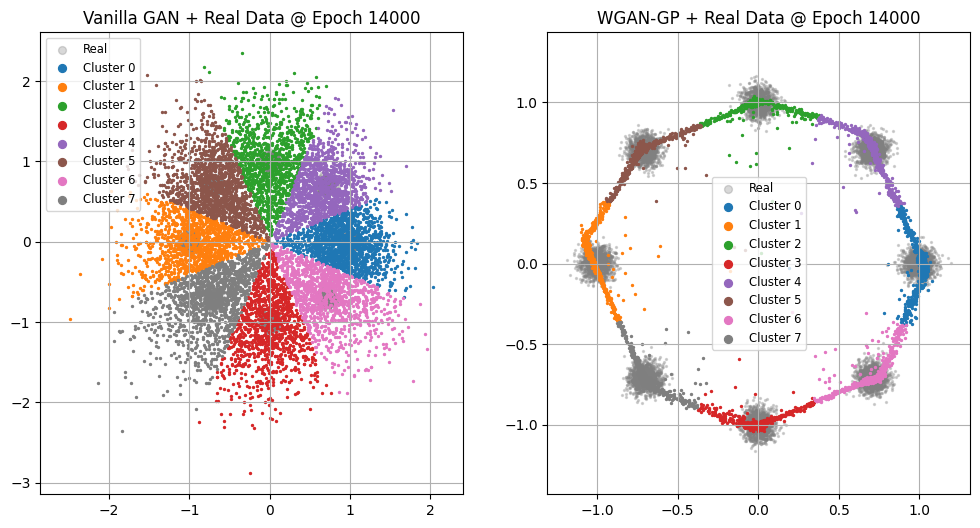

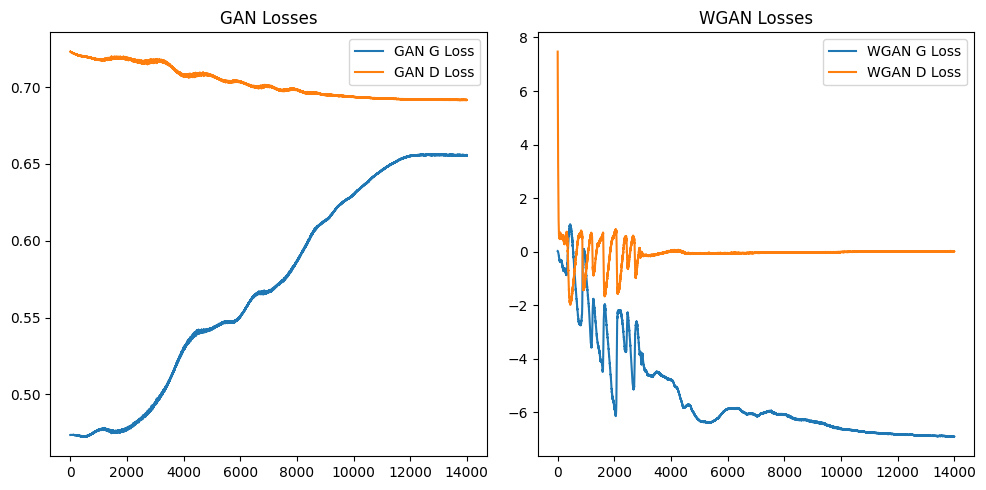

<Figure size 640x480 with 0 Axes>

[Epoch 14500] Vanilla D_loss: 0.6915 | G_loss: 0.6554
[Epoch 14500] WGAN-GP GP: 0.0008 | C_loss: 0.0189 | G_loss: -6.9099


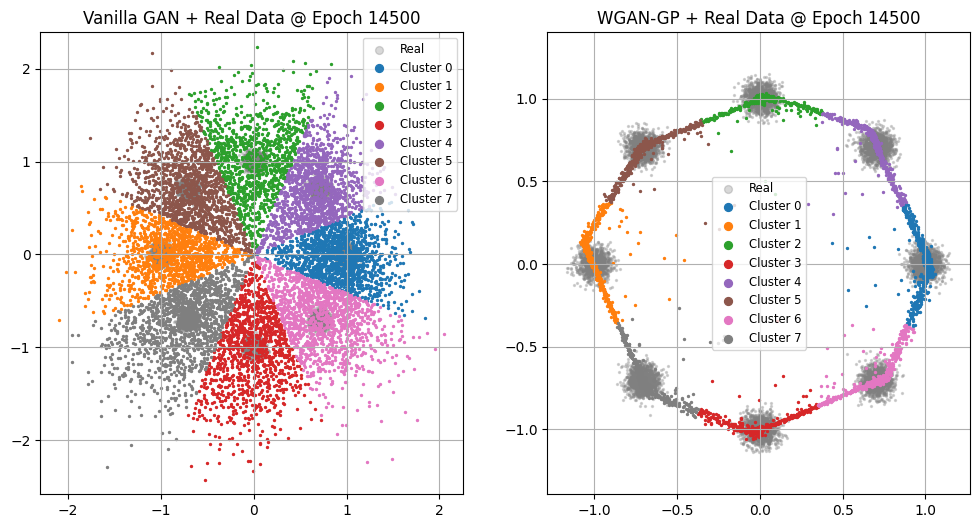

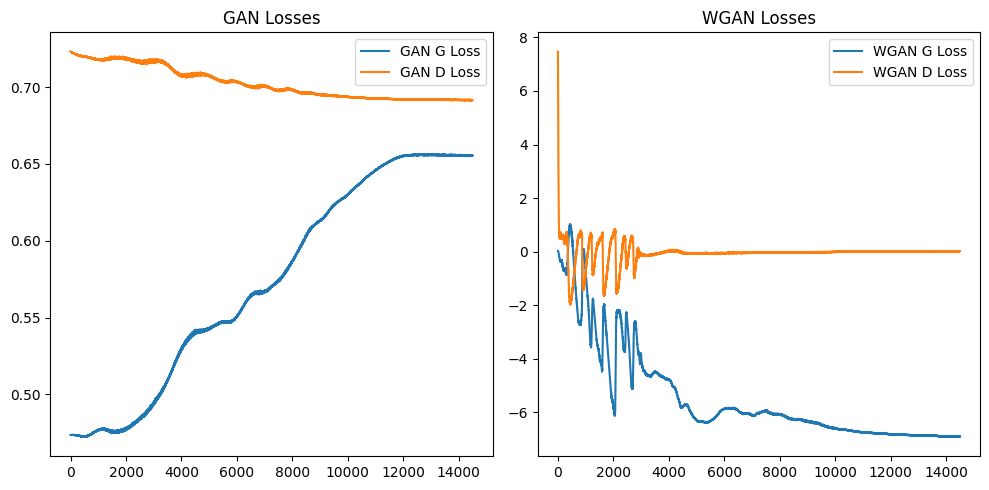

<Figure size 640x480 with 0 Axes>

[Epoch 15000] Vanilla D_loss: 0.6917 | G_loss: 0.6546
[Epoch 15000] WGAN-GP GP: 0.0006 | C_loss: 0.0172 | G_loss: -6.8922


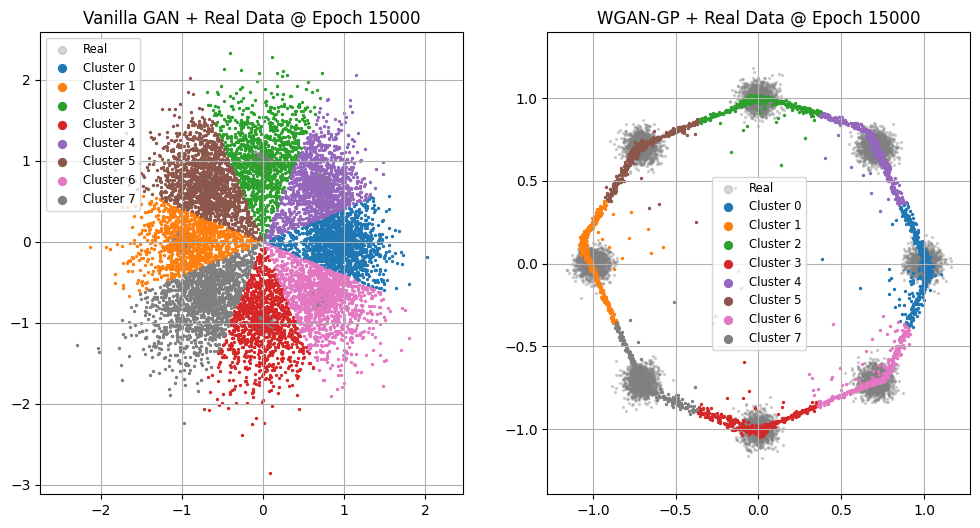

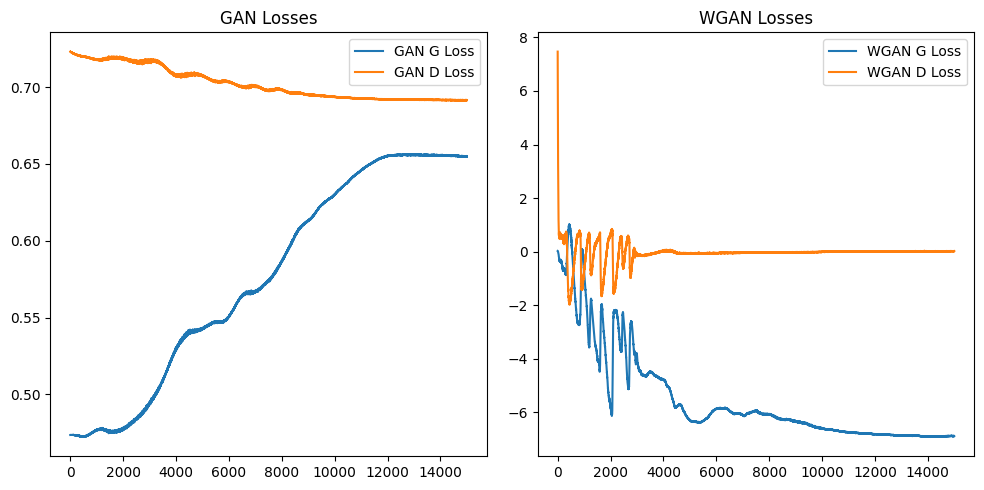

<Figure size 640x480 with 0 Axes>

[Epoch 15500] Vanilla D_loss: 0.6914 | G_loss: 0.6544
[Epoch 15500] WGAN-GP GP: 0.0009 | C_loss: 0.0207 | G_loss: -6.9193


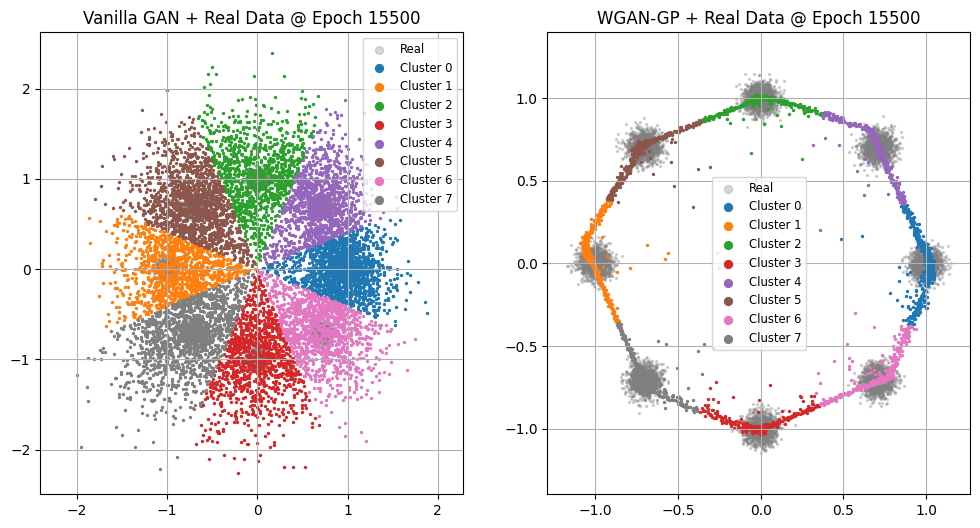

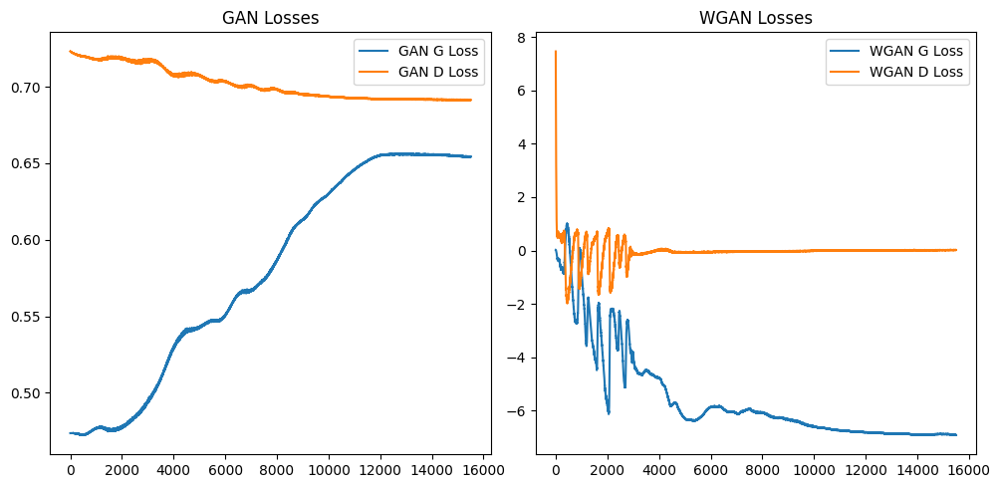

<Figure size 640x480 with 0 Axes>

In [ ]:
###############
#TRAINING
###############
centers = np.array([
    (1, 0), (-1, 0), (0, 1), (0, -1),
    (1/np.sqrt(2), 1/np.sqrt(2)), (-1/np.sqrt(2), 1/np.sqrt(2)),
    (1/np.sqrt(2), -1/np.sqrt(2)), (-1/np.sqrt(2), -1/np.sqrt(2))
])

gan_g_losses, gan_d_losses, wgan_g_losses, wgan_c_losses = [], [], [], []


for epoch in range(no_epochs):
    real_data = sample_8gaussians(batch_size).to(device)

    n_critic = 5 if epoch < 10000 else 1

    #========WGAN==========
    for _ in range(n_critic):
        z = torch.randn(batch_size, latent_shape, device = device)

        #Training Critic
        fake_samples = G_wgan(z)

        gp = compute_gradient_penalty(C_wgan, real_data, fake_samples.detach())

        C_loss_wgan = -torch.mean(C_wgan(real_data)) + torch.mean(C_wgan(fake_samples)) + lambda_gp * gp  
        # Critic Loss (to minimize) = E[D(fake)] - E[D(real)] + gradient penalty
        # Minimizing this is equivalent to maximizing the Wasserstein estimate

        opt_C_wgan.zero_grad()
        C_loss_wgan.backward()
        opt_C_wgan.step()


        # for p in C_wgan.parameters():
        #     p.data.clamp_(-clip_value, clip_value)


    #Training the generator for every n_critic iterations
    z = torch.randn(batch_size, latent_shape, device=device)
    gen_samples_WGAN = G_wgan(z)

    G_loss_wgan = -torch.mean(C_wgan(gen_samples_WGAN))  # Generator Loss: # Minimize negative critic score to improve generator

    opt_G_wgan.zero_grad()
    G_loss_wgan.backward()
    opt_G_wgan.step()

    # if epoch % 500 == 0:
    #         print(f"[{epoch}] GP: {gp.item():.4f} | C_loss: {C_loss_wgan.item():.4f} | G_loss: {G_loss_wgan.item():.4f}")

    wgan_g_losses.append(G_loss_wgan.item())
    wgan_c_losses.append(C_loss_wgan.item())


#=========GAN===========

    for i in range(steps_per_epoch):

        real_labels = torch.ones(batch_size, 1, device = device)
        fake_labels = torch.zeros(batch_size, 1, device = device)


        #Training Generator
        z = torch.randn(batch_size, latent_shape, device = device)
        gen_samples_GAN = G_gan(z)
        D_output = D_gan(gen_samples_GAN)

        G_loss_gan = criterion(D_output, real_labels)       # Generator Loss: we minimize this to make discriminator classify generated samples as real

        opt_G_gan.zero_grad()
        G_loss_gan.backward()
        opt_G_gan.step()


        #Training Discriminator
        #z = torch.randn(batch_size, latent_shape, device = device)
        fake_samples = G_gan(z).detach()

        D_real = D_gan(add_noise(real_data, std=0.05))
        D_fake = D_gan(add_noise(fake_samples,std=0.05))

        loss_real = criterion(D_real, real_labels)
        loss_fake = criterion(D_fake, fake_labels)

        D_loss_gan = (loss_fake + loss_real) / 2     # Discriminator Loss: Minimizing this helps the discriminator better distinguish real vs. fake data.

        opt_D_gan.zero_grad()
        D_loss_gan.backward()
        opt_D_gan.step()

        gan_g_losses.append(G_loss_gan.item())
        gan_d_losses.append(D_loss_gan.item())


    snapshots = []
    if epoch % 100 ==0:
        with torch.no_grad():
            z_gan = torch.randn(1024, latent_shape, device=device)
            z_wgan = torch.randn(1024, latent_shape, device=device)
            fake_gan = G_gan(z_gan).cpu().numpy()
            fake_wgan = G_wgan(z_wgan).cpu().numpy()
            real_plot = sample_8gaussians(10000).numpy()
            labels_vanilla = assign_colors(samples_vanilla, centers)
            labels_wgan = assign_colors(samples_wgan, centers)
        snapshots.append((epoch, real_samples, samples_vanilla, labels_vanilla, samples_wgan, labels_wgan))


    if epoch % 500 == 0:
        print(f"[Epoch {epoch}] Vanilla D_loss: {D_loss_gan.item():.4f} | G_loss: {G_loss_gan.item():.4f}")
        print(f"[Epoch {epoch}] WGAN-GP GP: {gp.item():.4f} | C_loss: {C_loss_wgan.item():.4f} | G_loss: {G_loss_wgan.item():.4f}")

        with torch.no_grad():
            samples_vanilla = G_gan(torch.randn(10000, latent_shape).to(device)).cpu().numpy()
            samples_wgan = G_wgan(torch.randn(10000, latent_shape).to(device)).cpu().numpy()
            real_samples = sample_8gaussians(10000).numpy()

            labels_vanilla = assign_colors(samples_vanilla, centers)
            labels_wgan = assign_colors(samples_wgan, centers)

            fig, axs = plt.subplots(1, 2, figsize=(12, 6))

            axs[0].scatter(real_samples[:, 0], real_samples[:, 1], s=2, c='gray', alpha=0.3, label='Real')
            for i in range(8):
                cluster_points = samples_vanilla[labels_vanilla == i]
                axs[0].scatter(cluster_points[:, 0], cluster_points[:, 1], s=2, label=f'Cluster {i}')
            axs[0].set_title(f"Vanilla GAN + Real Data @ Epoch {epoch}")
            axs[0].axis('equal')
            axs[0].legend(markerscale=4, fontsize='small')
            axs[0].grid(True)

            axs[1].scatter(real_samples[:, 0], real_samples[:, 1], s=2, c='gray', alpha=0.3, label='Real')
            for i in range(8):
                cluster_points = samples_wgan[labels_wgan == i]
                axs[1].scatter(cluster_points[:, 0], cluster_points[:, 1], s=2, label=f'Cluster {i}')
            axs[1].set_title(f"WGAN-GP + Real Data @ Epoch {epoch}")
            axs[1].axis('equal')
            axs[1].legend(markerscale=4, fontsize='small')
            axs[1].grid(True)

            plt.figure(figsize=(10, 5))
            plt.subplot(1, 2, 1)
            plt.plot(gan_g_losses, label="GAN G Loss")
            plt.plot(gan_d_losses, label="GAN D Loss")
            plt.title("GAN Losses")
            plt.legend()
            plt.subplot(1, 2, 2)
            plt.plot(wgan_g_losses, label="WGAN G Loss")
            plt.plot(wgan_c_losses, label="WGAN D Loss")
            plt.title("WGAN Losses")
            plt.legend()
            plt.tight_layout()
            plt.show()


            plt.tight_layout()
            plt.show()



We compared the mode coverage of a vanilla GAN and a WGAN-GP trained on a synthetic multimodal distribution containing 4 modes. Our results show that the GAN consistently suffers from mode collapse, overconentrating on a few modes while missing others. In contrast, the WGAN maintains diversity in its generated samples and captures all the modes throughout training. This demonstrates the advantage of using Wassertein loss in preserving the richness of complex data distribution.